##### In this project we have considered data from year 2000-2015 for 193 countries. I have focused on immunization factors, mortality factors, economic factors, social factors and other health related factors as well. This will help in suggesting a country which area should be given importance in order to efficiently improve the life expectancy of its population.

### The project aims to answers the following questions from the dataset
1. Does various predicting factors which has been chosen initially really affect the Life expectancy? What are the predicting variables actually affecting the life expectancy?

2. How does Infant and Adult mortality rates affect life expectancy?
3. Does Life Expectancy has positive or negative correlation with eating habits, lifestyle, exercise, smoking, drinking alcohol etc.
4. What is the impact of schooling on the lifespan of humans?
5. What is the impact of Immunization coverage on life Expectancy?

In [ ]:
from pathlib import Path
import pandas as pd
import urllib.request
import kagglehub
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from zlib import crc32
import plotly.express as px
from sklearn.impute import SimpleImputer
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, MinMaxScaler, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
def load_Life_Expectancy_data():
    dataset_path = kagglehub.dataset_download("kumarajarshi/life-expectancy-who")
    print("Path to dataset files:", dataset_path)

    csv_path = Path(dataset_path) / "Life Expectancy Data.csv"

    if not csv_path.is_file():
        raise FileNotFoundError(f"Expected dataset file 'Life Expectancy Data.csv' not found at {csv_path}")

    return pd.read_csv(csv_path)

data = load_Life_Expectancy_data()

100%|██████████| 119k/119k [00:00<00:00, 45.5MB/s]

Extracting files...
Path to dataset files: /root/.cache/kagglehub/datasets/kumarajarshi/life-expectancy-who/versions/1


In [ ]:
data.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [ ]:
data.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,2008.000000,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,2012.000000,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [ ]:
data["Country"].value_counts()

,count
Country,
Afghanistan,16
Peru,16
Nicaragua,16
Niger,16
Nigeria,16
...,...
Niue,1
San Marino,1
Nauru,1


In [ ]:
data["Status"].value_counts()

,count
Status,
Developing,2426
Developed,512


##Univariate Analysis


Univariate Analysis for 'Country':
Country
Afghanistan              16
Peru                     16
Nicaragua                16
Niger                    16
Nigeria                  16
                         ..
Niue                      1
San Marino                1
Nauru                     1
Saint Kitts and Nevis     1
Dominica                  1
Name: count, Length: 193, dtype: int64

Univariate Analysis for 'Year':
count    2938.000000
mean     2007.518720
std         4.613841
min      2000.000000
25%      2004.000000
50%      2008.000000
75%      2012.000000
max      2015.000000
Name: Year, dtype: float64


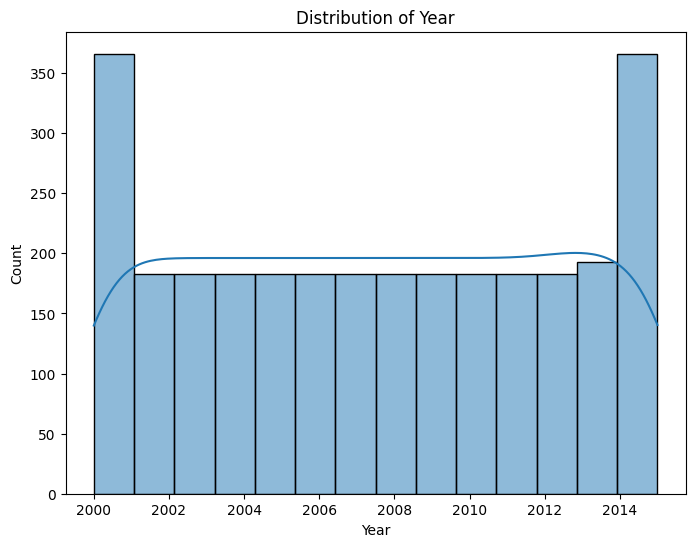


Univariate Analysis for 'Status':
Status
Developing    2426
Developed      512
Name: count, dtype: int64

Univariate Analysis for 'Life expectancy ':
count    2928.000000
mean       69.224932
std         9.523867
min        36.300000
25%        63.100000
50%        72.100000
75%        75.700000
max        89.000000
Name: Life expectancy , dtype: float64


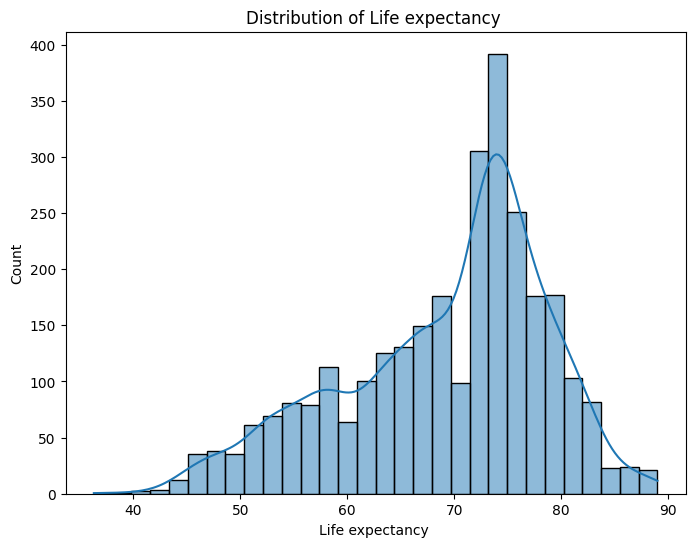


Univariate Analysis for 'Adult Mortality':
count    2928.000000
mean      164.796448
std       124.292079
min         1.000000
25%        74.000000
50%       144.000000
75%       228.000000
max       723.000000
Name: Adult Mortality, dtype: float64


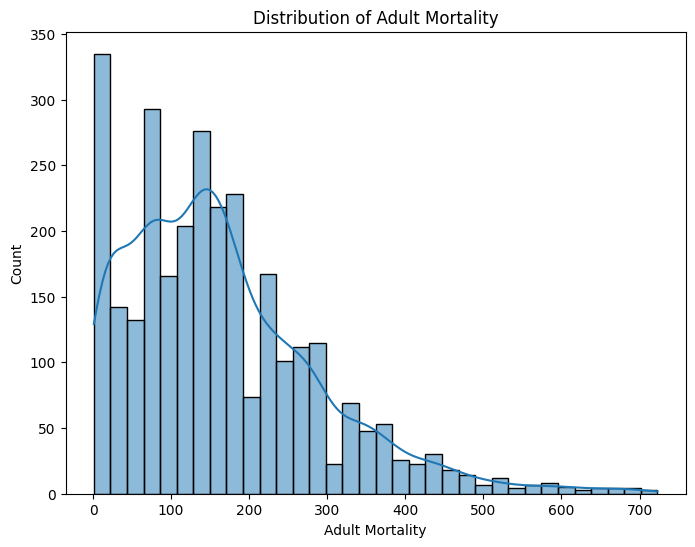


Univariate Analysis for 'infant deaths':
count    2938.000000
mean       30.303948
std       117.926501
min         0.000000
25%         0.000000
50%         3.000000
75%        22.000000
max      1800.000000
Name: infant deaths, dtype: float64


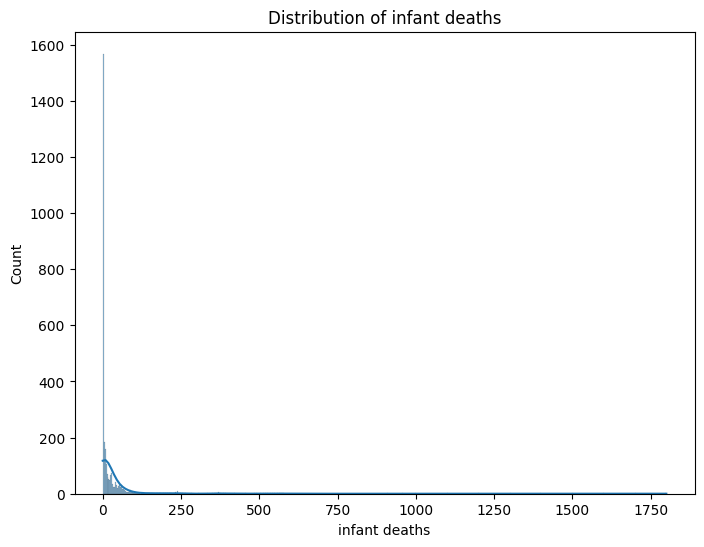


Univariate Analysis for 'Alcohol':
count    2744.000000
mean        4.602861
std         4.052413
min         0.010000
25%         0.877500
50%         3.755000
75%         7.702500
max        17.870000
Name: Alcohol, dtype: float64


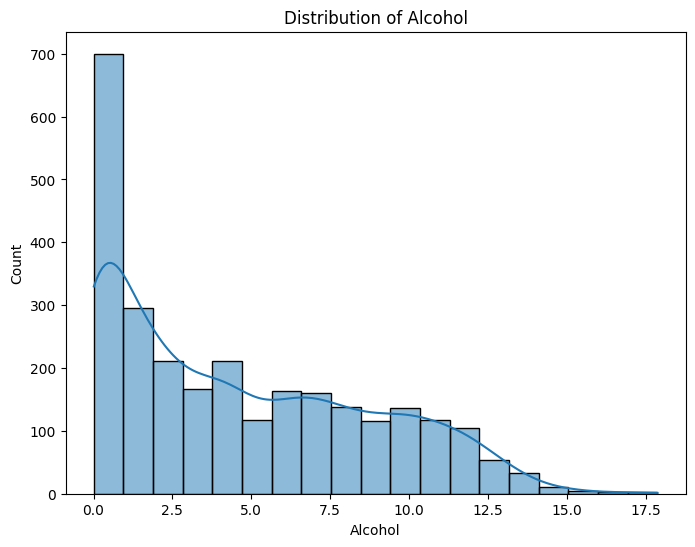


Univariate Analysis for 'percentage expenditure':
count     2938.000000
mean       738.251295
std       1987.914858
min          0.000000
25%          4.685343
50%         64.912906
75%        441.534144
max      19479.911610
Name: percentage expenditure, dtype: float64


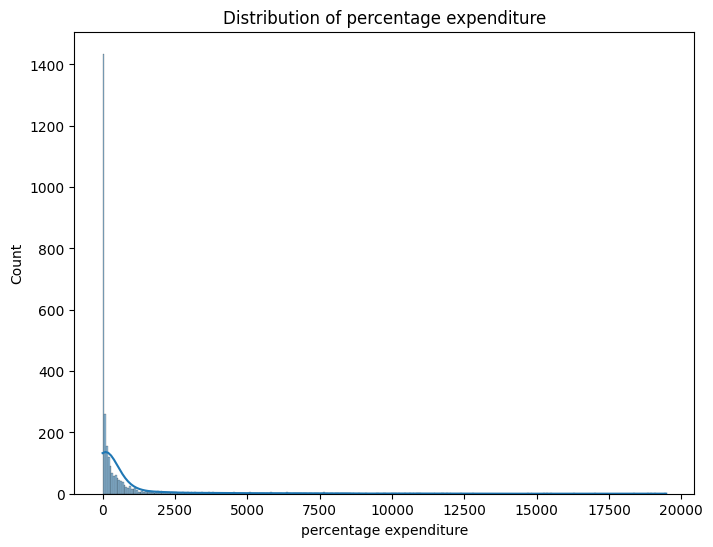


Univariate Analysis for 'Hepatitis B':
count    2385.000000
mean       80.940461
std        25.070016
min         1.000000
25%        77.000000
50%        92.000000
75%        97.000000
max        99.000000
Name: Hepatitis B, dtype: float64


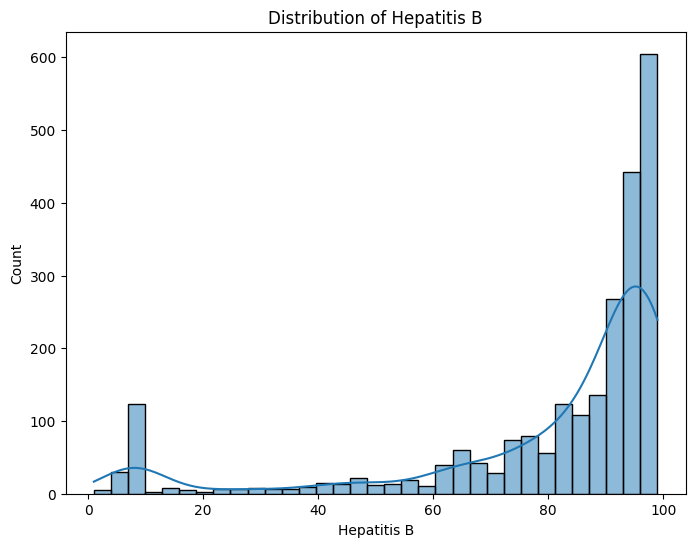


Univariate Analysis for 'Measles ':
count      2938.000000
mean       2419.592240
std       11467.272489
min           0.000000
25%           0.000000
50%          17.000000
75%         360.250000
max      212183.000000
Name: Measles , dtype: float64


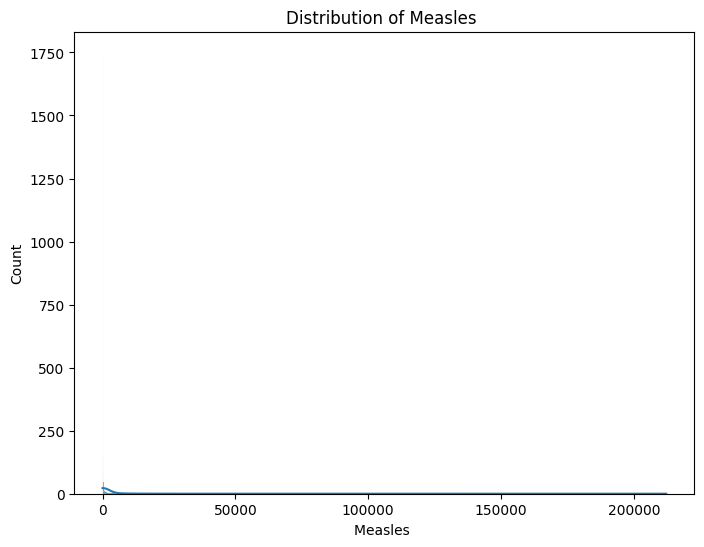


Univariate Analysis for ' BMI ':
count    2904.000000
mean       38.321247
std        20.044034
min         1.000000
25%        19.300000
50%        43.500000
75%        56.200000
max        87.300000
Name:  BMI , dtype: float64


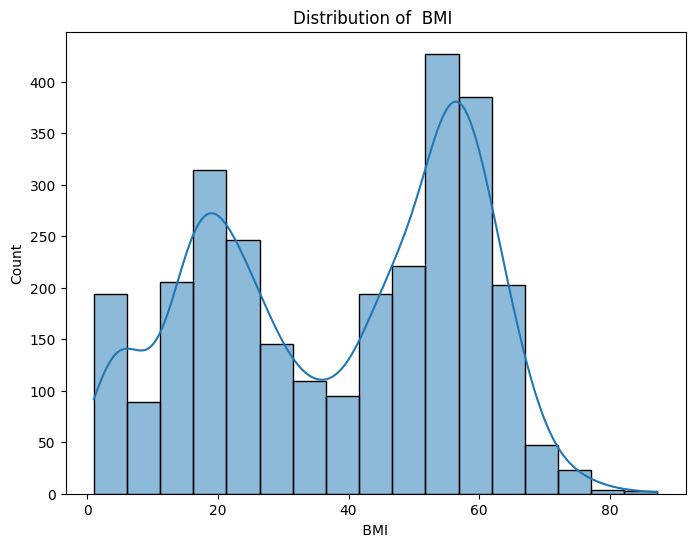


Univariate Analysis for 'under-five deaths ':
count    2938.000000
mean       42.035739
std       160.445548
min         0.000000
25%         0.000000
50%         4.000000
75%        28.000000
max      2500.000000
Name: under-five deaths , dtype: float64


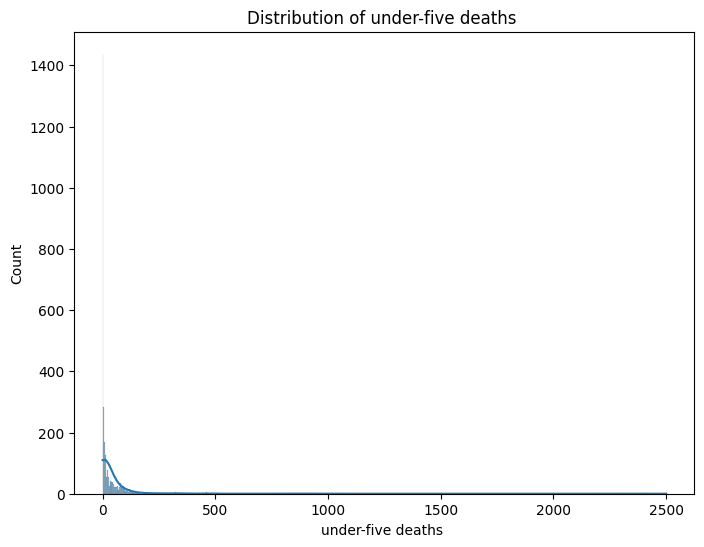


Univariate Analysis for 'Polio':
count    2919.000000
mean       82.550188
std        23.428046
min         3.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Polio, dtype: float64


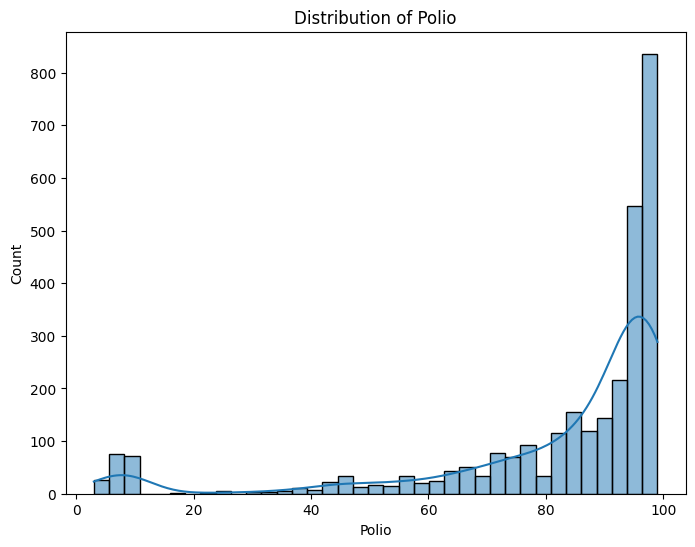


Univariate Analysis for 'Total expenditure':
count    2712.00000
mean        5.93819
std         2.49832
min         0.37000
25%         4.26000
50%         5.75500
75%         7.49250
max        17.60000
Name: Total expenditure, dtype: float64


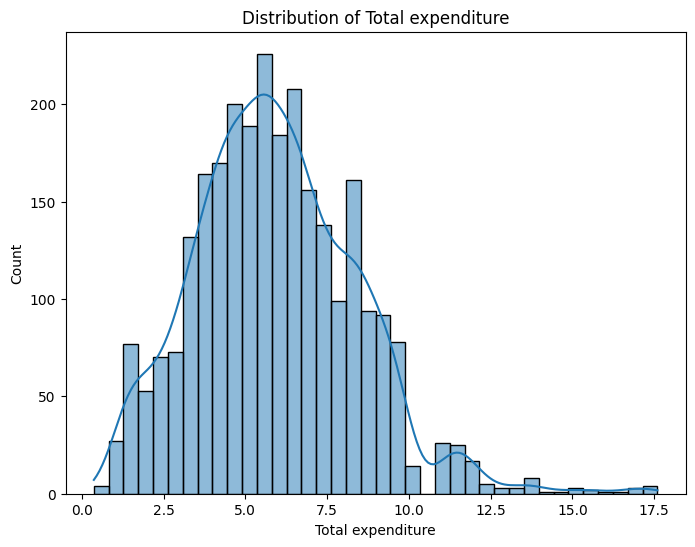


Univariate Analysis for 'Diphtheria ':
count    2919.000000
mean       82.324084
std        23.716912
min         2.000000
25%        78.000000
50%        93.000000
75%        97.000000
max        99.000000
Name: Diphtheria , dtype: float64


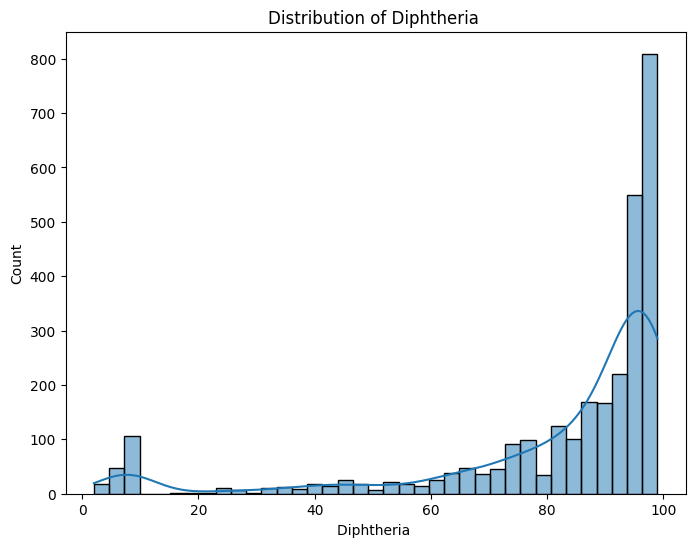


Univariate Analysis for ' HIV/AIDS':
count    2938.000000
mean        1.742103
std         5.077785
min         0.100000
25%         0.100000
50%         0.100000
75%         0.800000
max        50.600000
Name:  HIV/AIDS, dtype: float64


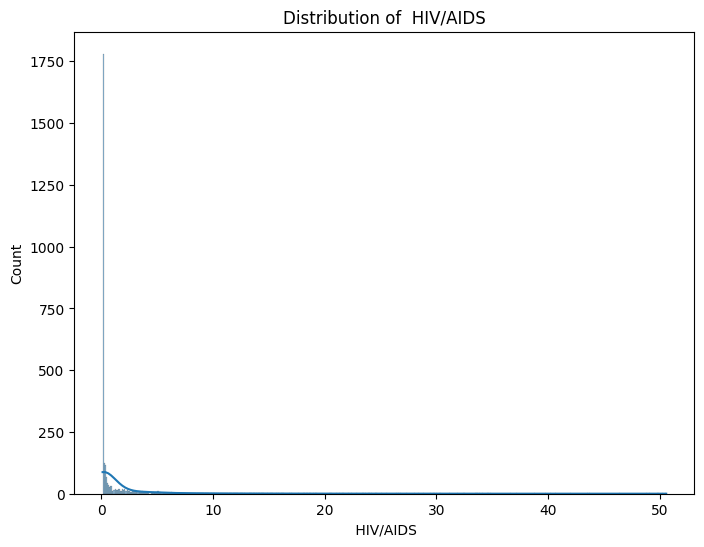


Univariate Analysis for 'GDP':
count      2490.000000
mean       7483.158469
std       14270.169342
min           1.681350
25%         463.935626
50%        1766.947595
75%        5910.806335
max      119172.741800
Name: GDP, dtype: float64


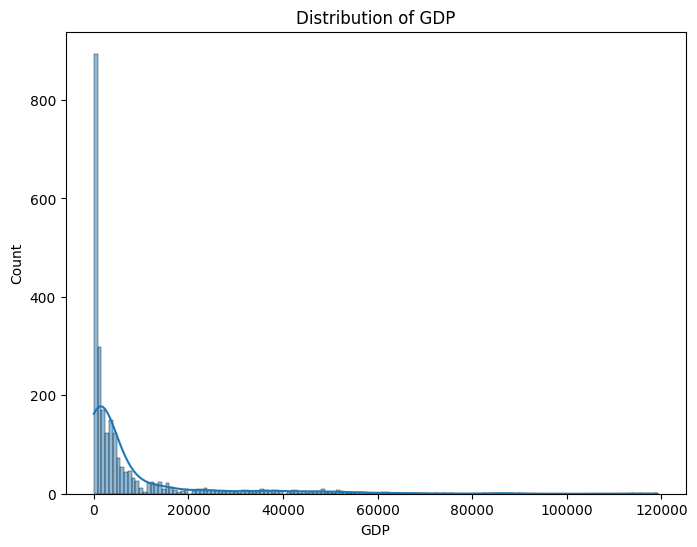


Univariate Analysis for 'Population':
count    2.286000e+03
mean     1.275338e+07
std      6.101210e+07
min      3.400000e+01
25%      1.957932e+05
50%      1.386542e+06
75%      7.420359e+06
max      1.293859e+09
Name: Population, dtype: float64


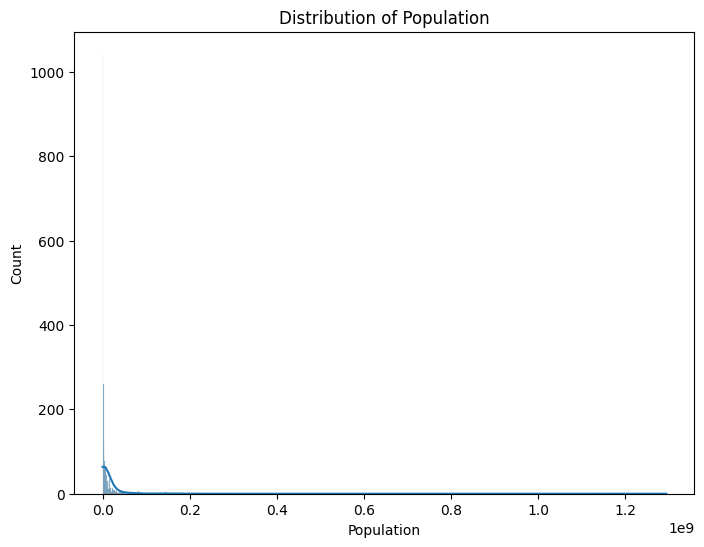


Univariate Analysis for ' thinness  1-19 years':
count    2904.000000
mean        4.839704
std         4.420195
min         0.100000
25%         1.600000
50%         3.300000
75%         7.200000
max        27.700000
Name:  thinness  1-19 years, dtype: float64


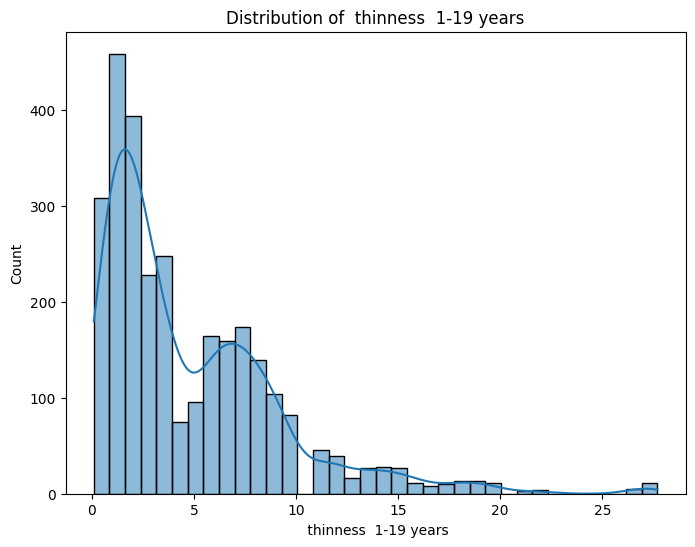


Univariate Analysis for ' thinness 5-9 years':
count    2904.000000
mean        4.870317
std         4.508882
min         0.100000
25%         1.500000
50%         3.300000
75%         7.200000
max        28.600000
Name:  thinness 5-9 years, dtype: float64


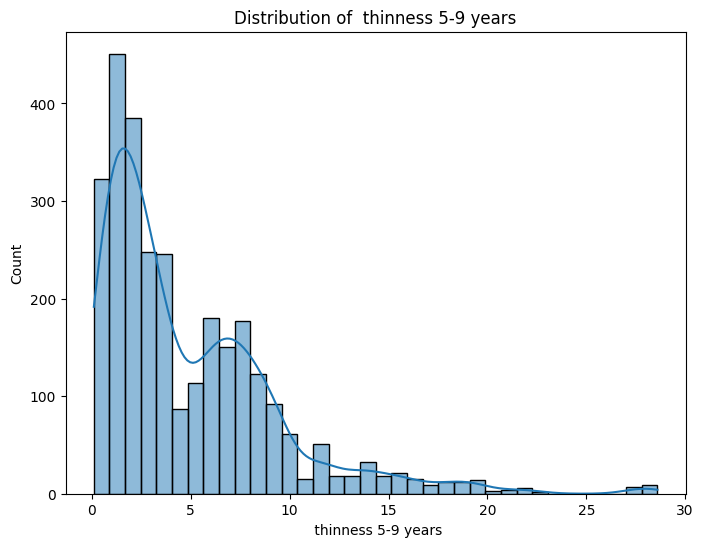


Univariate Analysis for 'Income composition of resources':
count    2771.000000
mean        0.627551
std         0.210904
min         0.000000
25%         0.493000
50%         0.677000
75%         0.779000
max         0.948000
Name: Income composition of resources, dtype: float64


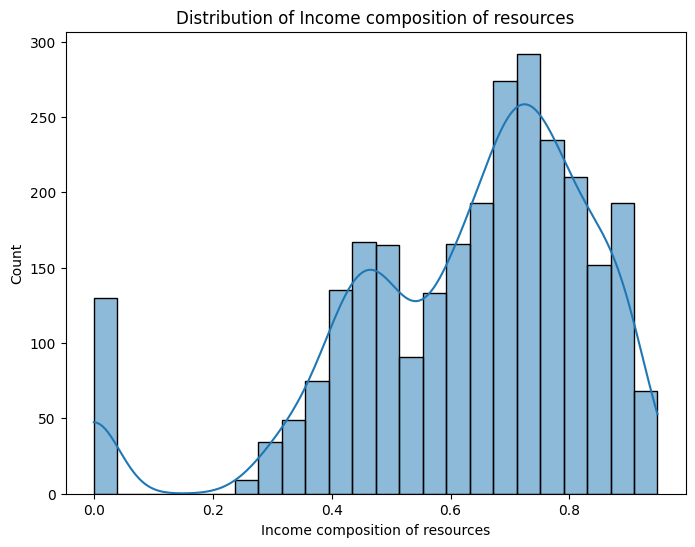


Univariate Analysis for 'Schooling':
count    2775.000000
mean       11.992793
std         3.358920
min         0.000000
25%        10.100000
50%        12.300000
75%        14.300000
max        20.700000
Name: Schooling, dtype: float64


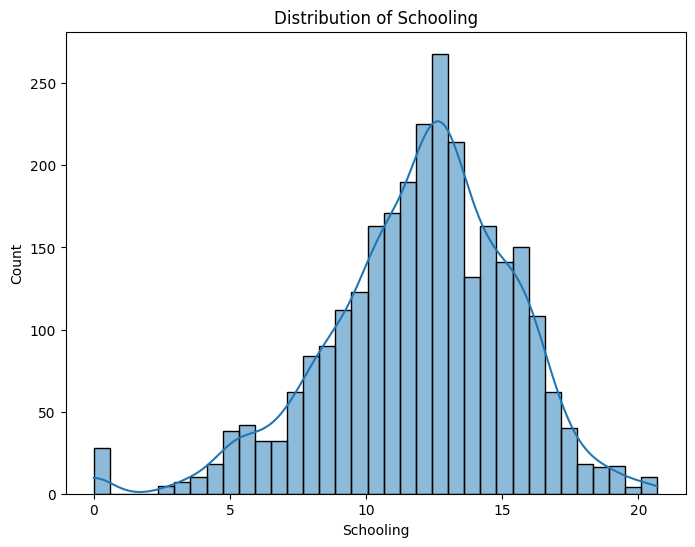

In [ ]:
# Univariate analysis for all columns
for col in data.columns:
    print(f"\nUnivariate Analysis for '{col}':")
    if data[col].dtype == 'object':  # Categorical column
        print(data[col].value_counts())
    elif data[col].dtype in ['int64', 'float64']:  # Numerical column
        print(data[col].describe())
        plt.figure(figsize=(8, 6))
        sns.histplot(data[col], kde=True)
        plt.title(f"Distribution of {col}")
        plt.show()

    else:
        print(f"Column '{col}' has an unsupported data type.")

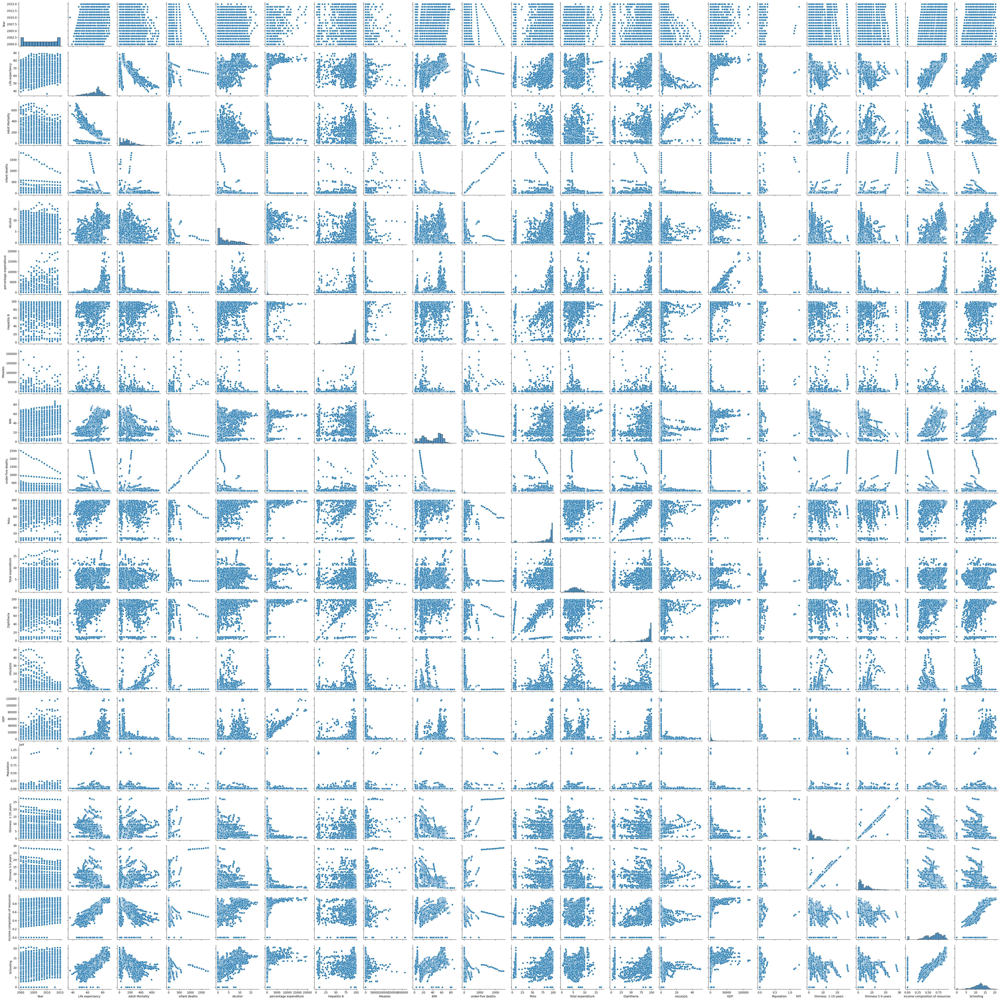

In [ ]:
sns.pairplot(data)
plt.show()

##Bivariate Analysis

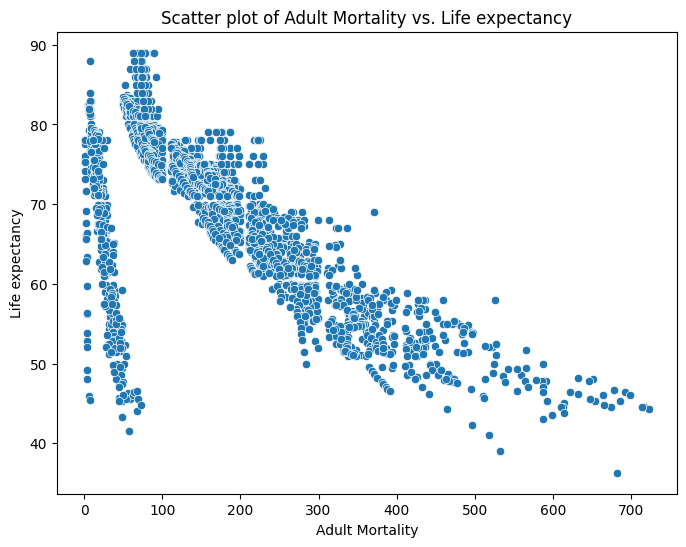

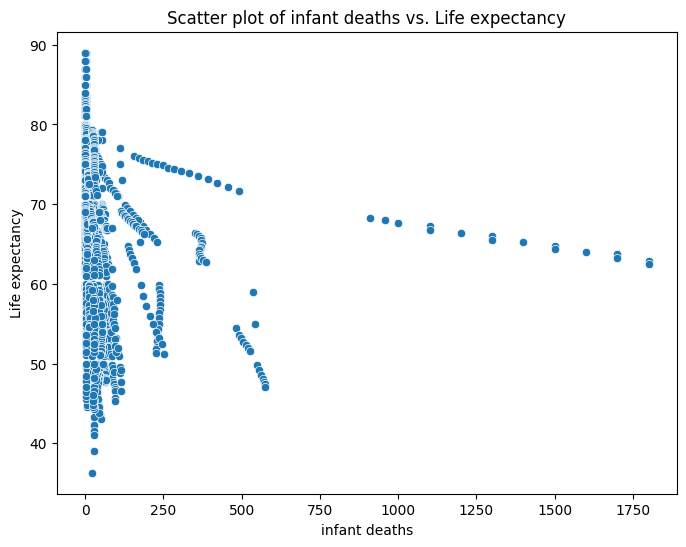

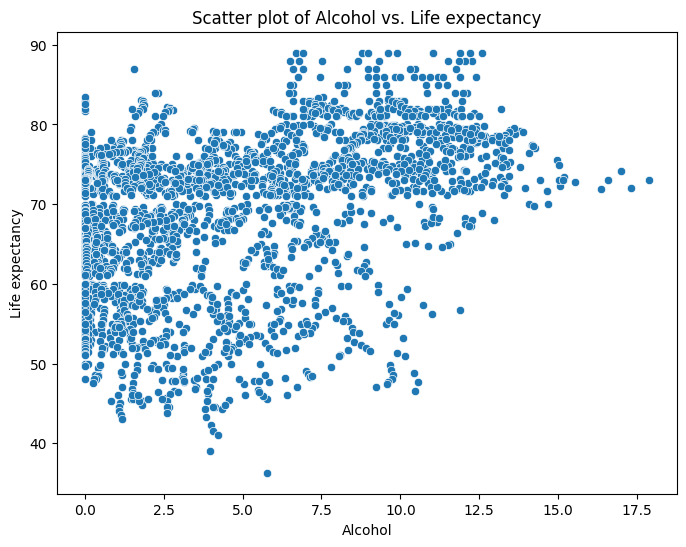

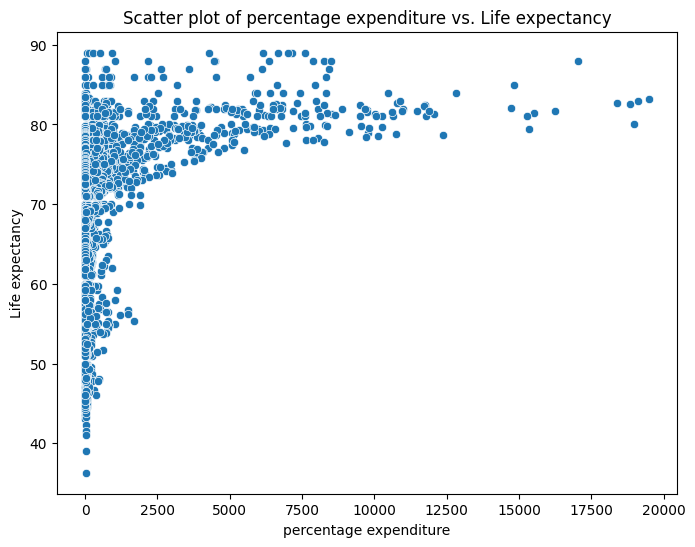

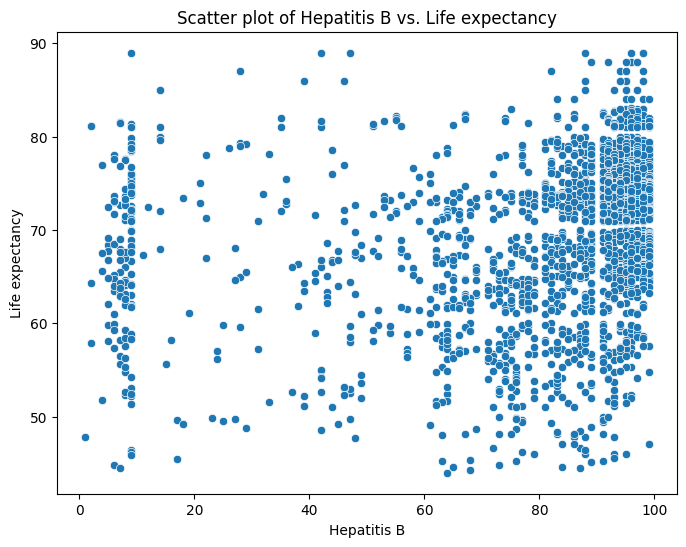

...

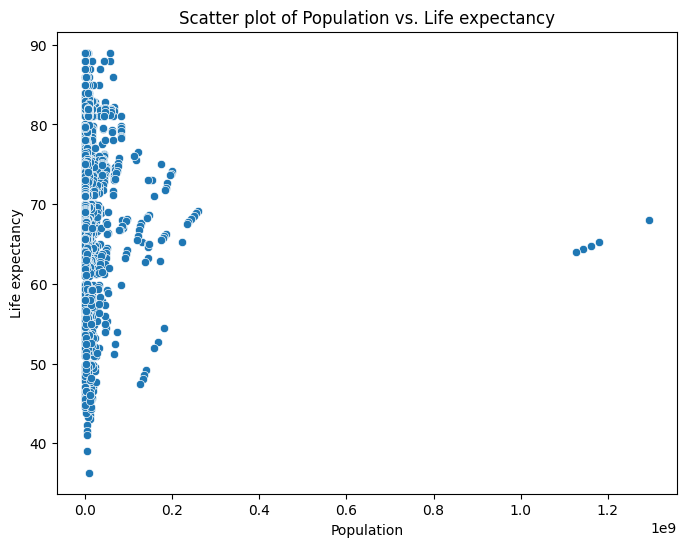

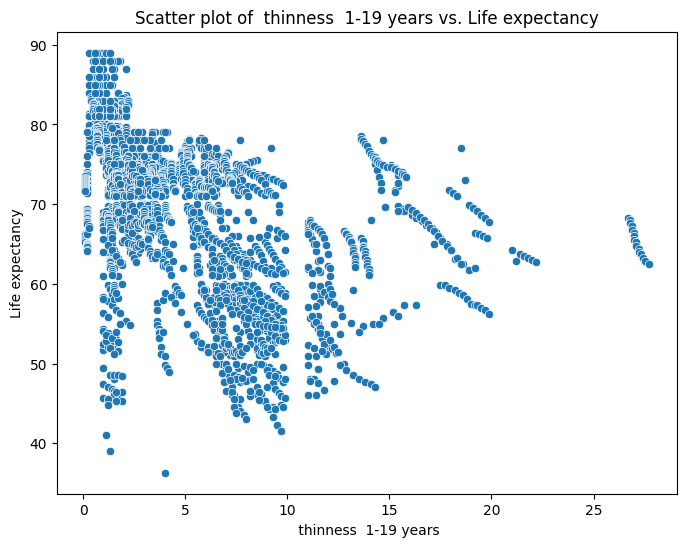

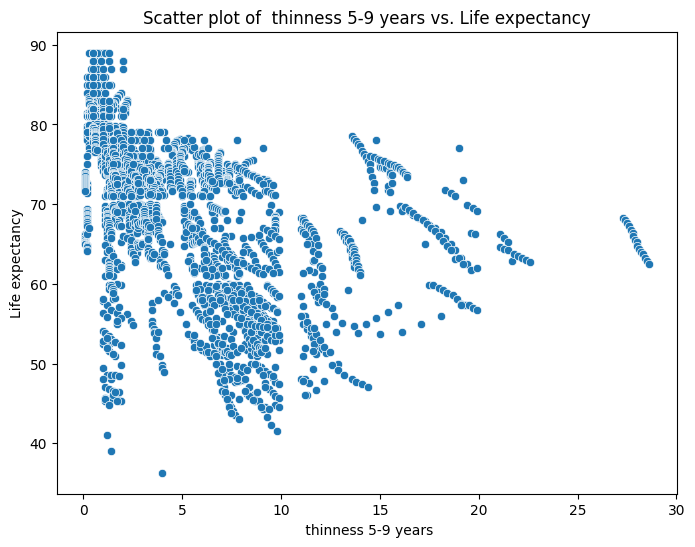

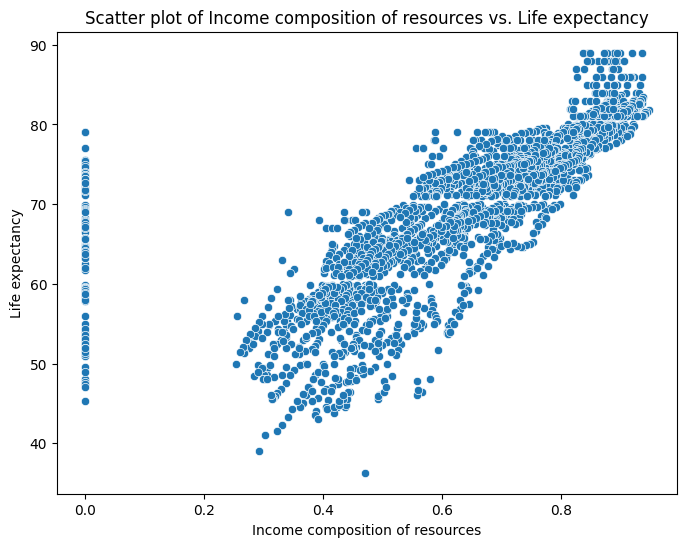

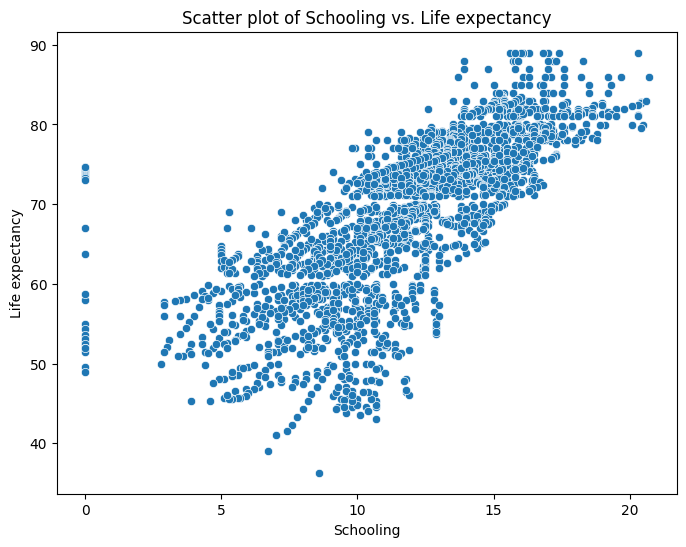

In [ ]:
# Identify numerical columns (excluding 'Life expectancy ')
numerical_cols = data.select_dtypes(include=['number']).columns
numerical_cols = numerical_cols.drop('Life expectancy ')
numerical_cols = numerical_cols.drop('Year')
# Create scatter plots for each numerical column against 'Life expectancy '
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=col, y='Life expectancy ', data=data)
    plt.title(f'Scatter plot of {col} vs. Life expectancy')
    plt.xlabel(col)
    plt.ylabel('Life expectancy')
    plt.show()

In [ ]:
np.random.seed(42)

In [ ]:
def shuffle_and_split_data(data, test_ratio):
    shuffled_indices = np.random.permutation(len(data))
    test_set_size = int(len(data) * test_ratio)
    test_indices = shuffled_indices[:test_set_size]
    train_indices = shuffled_indices[test_set_size:]
    return data.iloc[train_indices], data.iloc[test_indices]

In [ ]:
train_set, test_set = shuffle_and_split_data(data, 0.2)
len(train_set)

2351

In [ ]:
len(test_set)

587

In [ ]:
def is_id_in_test_set(identifier, test_ratio):
    return crc32(np.int64(identifier)) < test_ratio * 2**32

def split_data_with_id_hash(data, test_ratio, id_column):
    ids = data[id_column]
    in_test_set = ids.apply(lambda id_: is_id_in_test_set(id_, test_ratio))
    return data.loc[~in_test_set], data.loc[in_test_set]

In [ ]:
LE_data_with_id = data.reset_index()
train_set, test_set = split_data_with_id_hash(LE_data_with_id, 0.2, "index")

In [ ]:
def check_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers


numerical_cols = LE_data_with_id.select_dtypes(include=np.number).columns
# Exclude columns that are not relevant for outlier analysis
numerical_cols = numerical_cols.drop(['index', 'Year'])

for col in numerical_cols:
    outliers = check_outliers_iqr(LE_data_with_id, col)
    if not outliers.empty:
        print(f"Outliers in column '{col}':")
        print(outliers[[col]])  # Print only the outlier values for the specific column
    else:
        print(f"No outliers found in column '{col}'")

Outliers in column 'Life expectancy ':
      Life expectancy 
1127              36.3
1583              44.0
1584              43.5
1585              43.1
2307              43.3
2308              42.3
2309              41.5
2311              41.0
2312              39.0
2921              43.8
Outliers in column 'Adult Mortality':
      Adult Mortality
345             491.0
346             566.0
347             652.0
348             693.0
349             699.0
...               ...
2932            717.0
2933            723.0
2934            715.0
2936            686.0
2937            665.0

[82 rows x 1 columns]
Outliers in column 'infant deaths':
      infant deaths
0                62
1                64
2                66
3                69
4                71
...             ...
2789            100
2790            103
2791            106
2792            110
2793            114

[315 rows x 1 columns]
No outliers found in column 'Alcohol'
Outliers in column 'percentage expenditure':


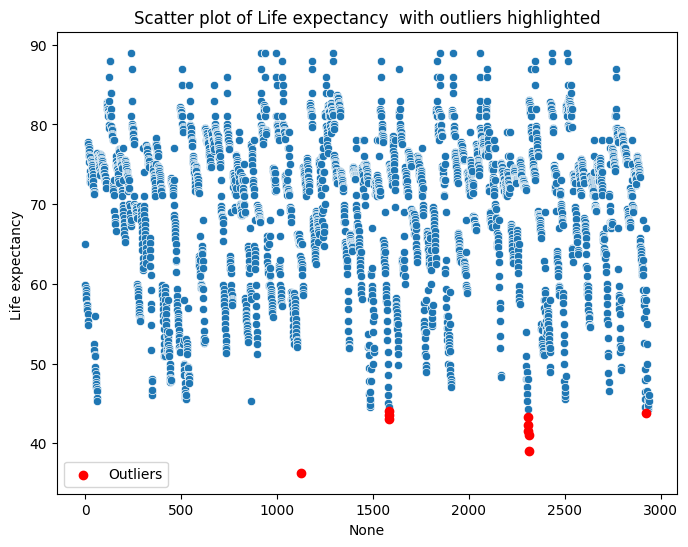

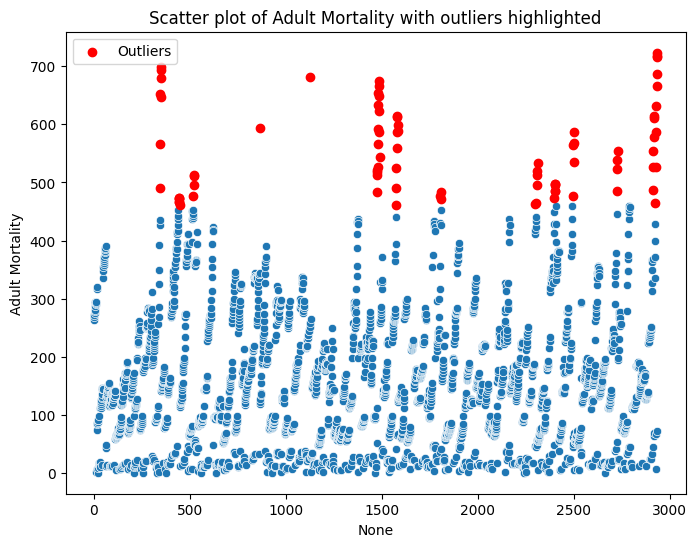

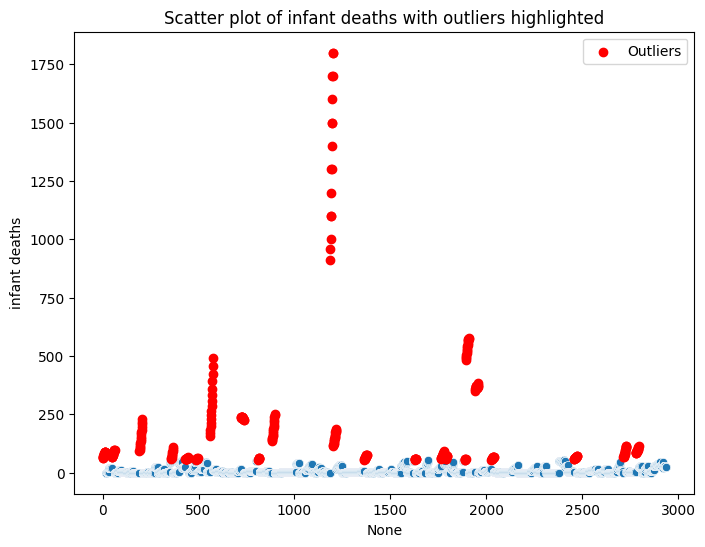

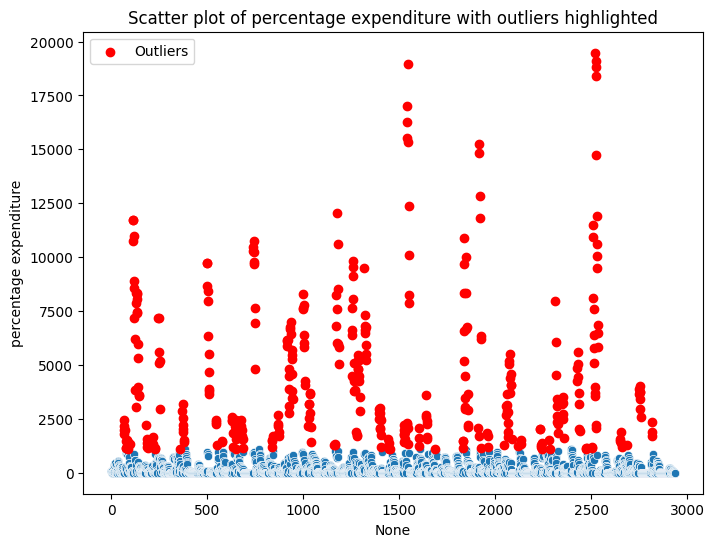

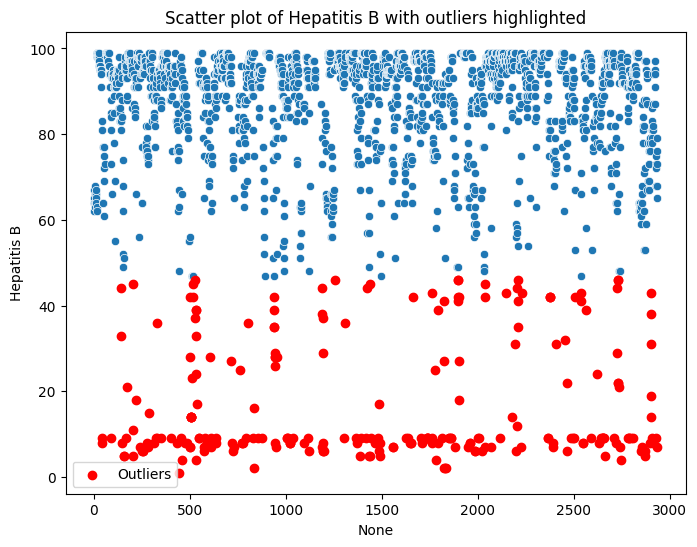

...

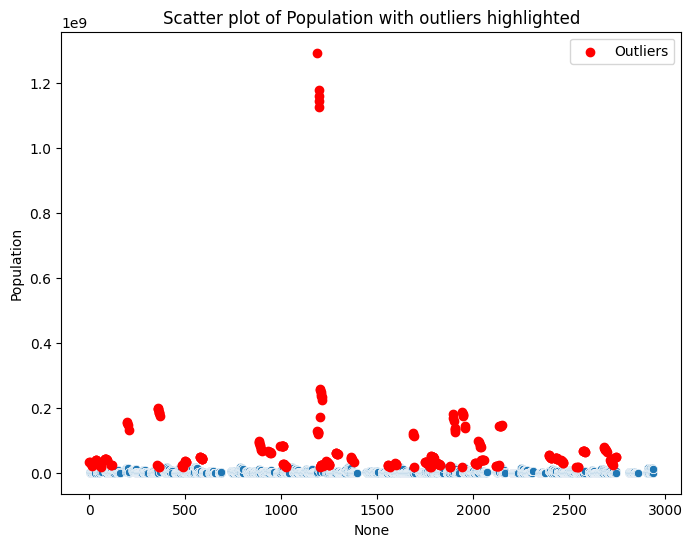

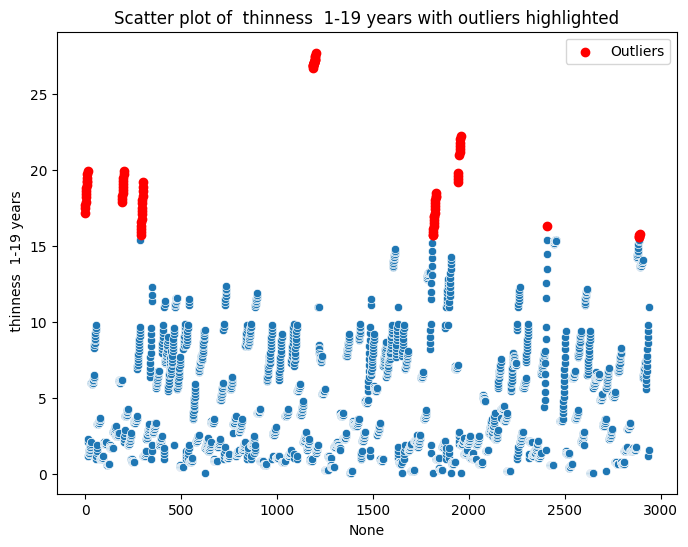

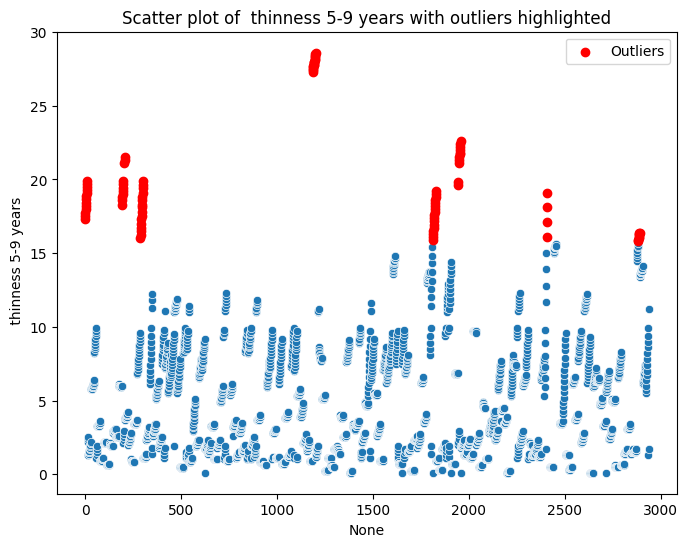

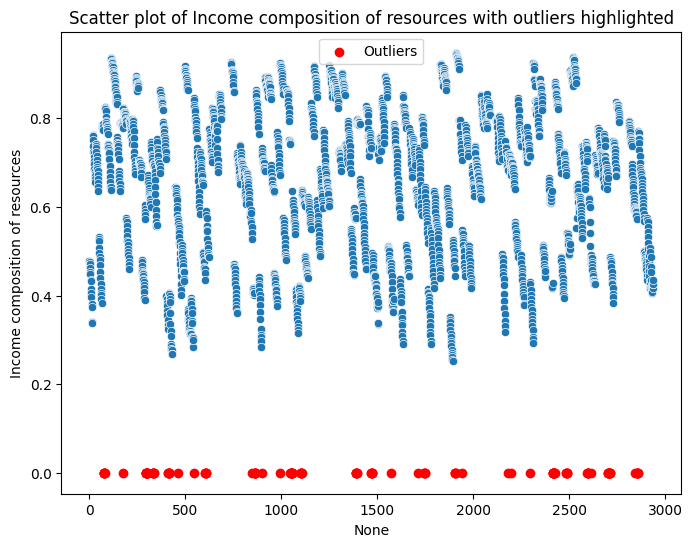

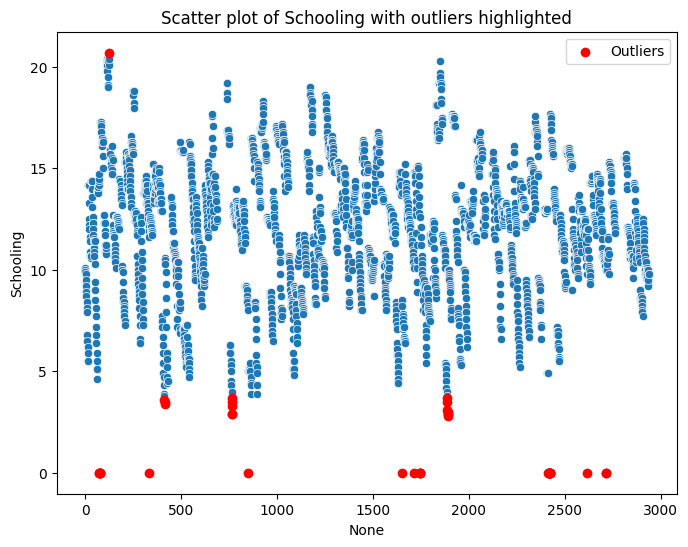

In [ ]:
for col in numerical_cols:
    outliers = check_outliers_iqr(LE_data_with_id, col)
    if not outliers.empty:
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=LE_data_with_id.index, y=LE_data_with_id[col])
        plt.scatter(outliers.index, outliers[col], color='red', label='Outliers')
        plt.title(f'Scatter plot of {col} with outliers highlighted')
        plt.legend()
        plt.show()

#### checking for null values

In [ ]:
data.isnull().sum()

,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553
Measles,0


#### Missing data percentages

In [ ]:
missing_percentage = data.isnull().sum() * 100 / len(data)

# Print the results
missing_percentage

,0
Country,0.000000
Year,0.000000
Status,0.000000
Life expectancy,0.340368
Adult Mortality,0.340368
infant deaths,0.000000
Alcohol,6.603131
percentage expenditure,0.000000
Hepatitis B,18.822328
Measles,0.000000


In [ ]:
Life_Expectancy = LE_data_with_id.copy()

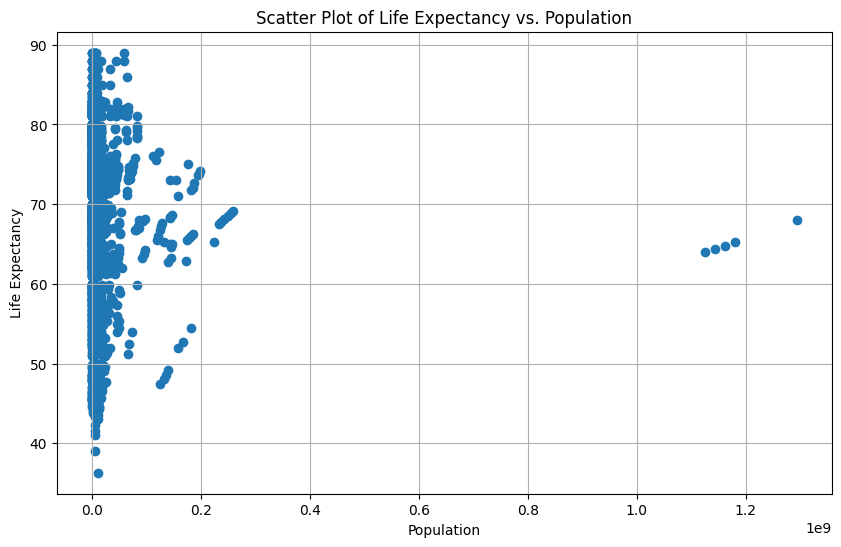

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(data['Population'], data['Life expectancy '])
plt.xlabel('Population')
plt.ylabel('Life Expectancy')
plt.title('Scatter Plot of Life Expectancy vs. Population')
plt.grid(True)
plt.show()

##Visualizing geographic Data

In [ ]:
country_life_expectancy = data.groupby('Country')['Life expectancy '].mean().reset_index()

# Use plotly.express for an interactive world map
fig = px.choropleth(country_life_expectancy, locations="Country",
                    locationmode='country names',
                    color="Life expectancy ",
                    hover_name="Country",
                    color_continuous_scale="Viridis",
                    title="World Map: Average Life Expectancy by Country",
                    range_color=[data['Life expectancy '].min(), data['Life expectancy '].max()]) # Set color range

fig.show()

##Correlations between the features or the columns

In [ ]:
corr_matrix = Life_Expectancy.corr(numeric_only=True)

In [ ]:
corr_matrix["Life expectancy "].sort_values(ascending=False)

,Life expectancy
Life expectancy,1.000000
Schooling,0.751975
Income composition of resources,0.724776
BMI,0.567694
Diphtheria,0.479495
Polio,0.465556
GDP,0.461455
Alcohol,0.404877
percentage expenditure,0.381864
Hepatitis B,0.256762


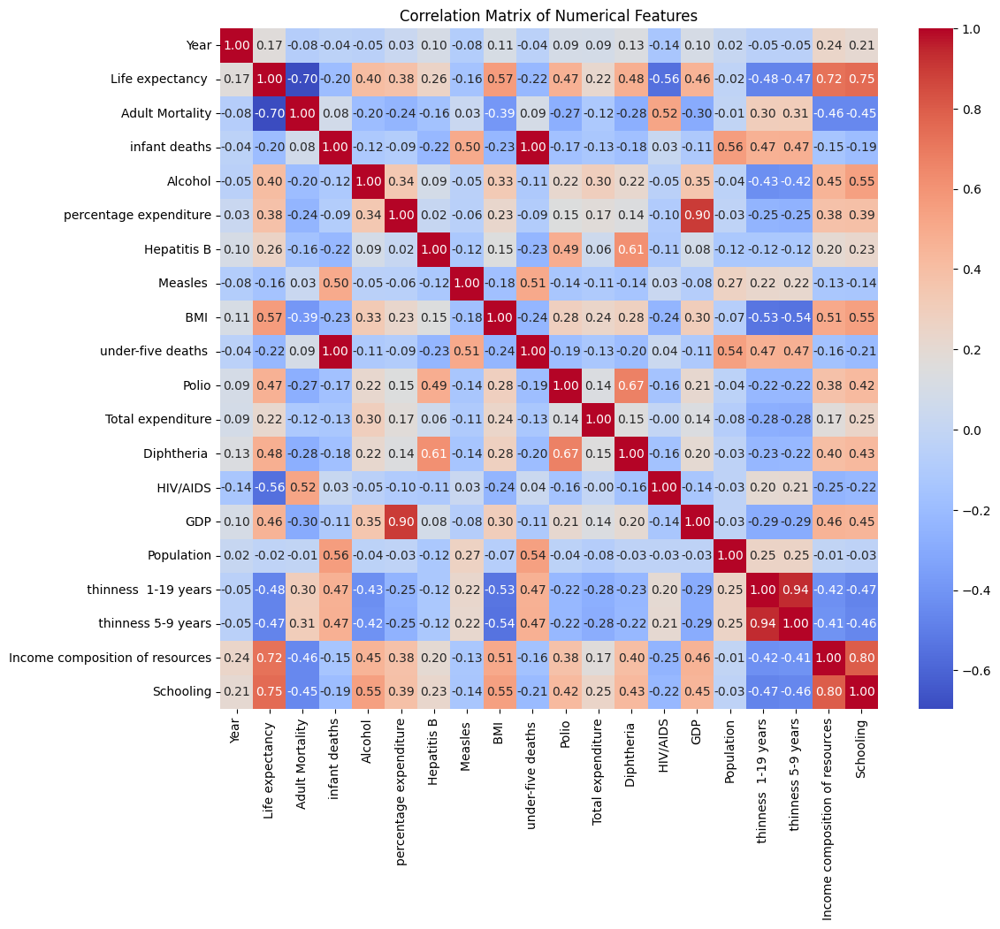

In [ ]:
numerical_cols = Life_Expectancy.select_dtypes(include=['number']).columns
numerical_cols = numerical_cols.drop('index')

# Calculate the correlation matrix for numerical columns
corr_matrix = Life_Expectancy[numerical_cols].corr()

# Plotting the correlation matrix using a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Features')
plt.show()

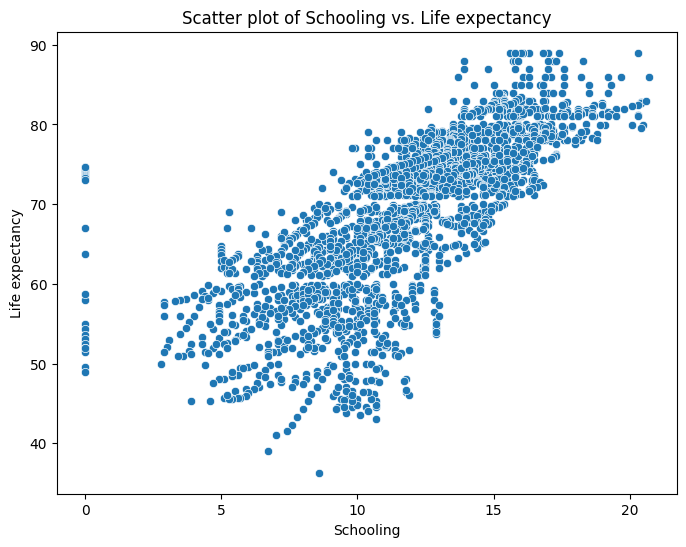

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Schooling', y='Life expectancy ', data=data)
plt.title('Scatter plot of Schooling vs. Life expectancy')
plt.xlabel('Schooling')
plt.ylabel('Life expectancy')
plt.show()

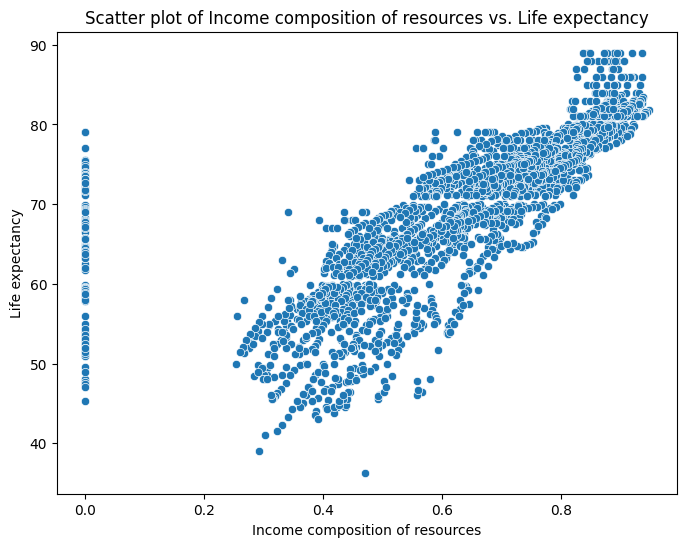

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Income composition of resources', y='Life expectancy ', data=data)
plt.title('Scatter plot of Income composition of resources vs. Life expectancy')
plt.xlabel('Income composition of resources')
plt.ylabel('Life expectancy')
plt.show()

##Data Cleaning

In [ ]:
LE_data = Life_Expectancy.copy()

In [ ]:
LE_data.isnull().sum()

,0
index,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553


## Filling the GDP and Population columns where they were empty with the matching values from similar occuring

In [ ]:
# Find null values in 'GDP' and 'Population'
null_gdp = LE_data['GDP'].isnull()
null_pop = LE_data['Population'].isnull()

# Iterate through rows with null values
for index in LE_data[null_gdp | null_pop].index:
    country = LE_data.loc[index, 'Country']
    # Find other rows with the same country
    same_country_rows = LE_data[LE_data['Country'] == country]

    # If there are other rows with the same country and non-null GDP/Population
    if len(same_country_rows) > 1 and not same_country_rows[['GDP', 'Population']].isnull().all().all():

        # Calculate the mean GDP and Population for the country, excluding nulls
        mean_gdp = same_country_rows['GDP'].mean(skipna=True)
        mean_pop = same_country_rows['Population'].mean(skipna=True)

        # Replace null values with calculated means
        if pd.isnull(LE_data.loc[index, 'GDP']):
            LE_data.loc[index, 'GDP'] = mean_gdp
        if pd.isnull(LE_data.loc[index, 'Population']):
            LE_data.loc[index, 'Population'] = mean_pop

In [ ]:
LE_data.isnull().sum()

,0
index,0
Country,0
Year,0
Status,0
Life expectancy,10
Adult Mortality,10
infant deaths,0
Alcohol,194
percentage expenditure,0
Hepatitis B,553


##### As they had very low amount of missing rows i thought of just removing them cause we loose like 10-20 rows out of 3000 but i did think that the rows that might have been removed could have been from the countries or rows that had very low frequency of occurance in the dataset that can cause some errors.

In [ ]:
# Drop rows with null values in specified columns
columns_to_check = ['Life expectancy ', 'Adult Mortality', ' BMI ', 'Polio', 'Diphtheria ']
LE_data = LE_data.dropna(subset=columns_to_check)

###Exploring all the columns/features that has many missing values and then either imputing/filling them with mean/median or removing them

In [ ]:
LE_data['Alcohol'].fillna(LE_data['Alcohol'].median(), inplace=True)

<ipython-input-35-e629ed98f805>:1: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.





In [ ]:
LE_data.isnull().sum()

,0
index,0
Country,0
Year,0
Status,0
Life expectancy,0
Adult Mortality,0
infant deaths,0
Alcohol,0
percentage expenditure,0
Hepatitis B,525


In [ ]:
null_rows_idx = LE_data.isnull().any(axis=1)

In [ ]:
imputer = SimpleImputer(strategy="median")

In [ ]:
LE_data_num = LE_data.select_dtypes(include=[np.number])

In [ ]:
imputer.fit(LE_data_num)

SimpleImputer(strategy='median')

In [ ]:
imputer.statistics_

array([1.44550000e+03, 2.00800000e+03, 7.22000000e+01, 1.43000000e+02,
       3.00000000e+00, 3.81000000e+00, 6.76870075e+01, 9.20000000e+01,
       1.70000000e+01, 4.32500000e+01, 4.00000000e+00, 9.30000000e+01,
       5.75000000e+00, 9.30000000e+01, 1.00000000e-01, 1.76694760e+03,
       1.39175650e+06, 3.35000000e+00, 3.40000000e+00, 6.79500000e-01,
       1.24000000e+01])

###Check that this is the same as manually computing the median of each attribute:

In [ ]:
LE_data_num.median().values

array([1.44550000e+03, 2.00800000e+03, 7.22000000e+01, 1.43000000e+02,
       3.00000000e+00, 3.81000000e+00, 6.76870075e+01, 9.20000000e+01,
       1.70000000e+01, 4.32500000e+01, 4.00000000e+00, 9.30000000e+01,
       5.75000000e+00, 9.30000000e+01, 1.00000000e-01, 1.76694760e+03,
       1.39175650e+06, 3.35000000e+00, 3.40000000e+00, 6.79500000e-01,
       1.24000000e+01])

###Transform the training set:

In [ ]:
X = imputer.transform(LE_data_num)

In [ ]:
imputer.feature_names_in_

array(['index', 'Year', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure',
       'Hepatitis B', 'Measles ', ' BMI ', 'under-five deaths ', 'Polio',
       'Total expenditure', 'Diphtheria ', ' HIV/AIDS', 'GDP',
       'Population', ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'], dtype=object)

In [ ]:
LE_data_tr = pd.DataFrame(X, columns=LE_data_num.columns,
                          index=LE_data_num.index)

In [ ]:
LE_data_tr.loc[null_rows_idx].head()

,index,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
32,32.0,2015.0,75.6,19.0,21.0,3.81,0.000000,95.0,63.0,59.5,...,95.0,5.75,95.0,0.1,4132.762920,39871528.0,6.0,5.8,0.743,14.4
44,44.0,2003.0,71.7,146.0,20.0,0.34,25.018523,92.0,15374.0,47.0,...,87.0,3.60,87.0,0.1,294.335560,3243514.0,6.3,6.1,0.663,11.5
45,45.0,2002.0,71.6,145.0,20.0,0.36,148.511984,92.0,5862.0,46.1,...,86.0,3.73,86.0,0.1,1774.336730,3199546.0,6.3,6.2,0.653,11.1
46,46.0,2001.0,71.4,145.0,20.0,0.23,147.986071,92.0,2686.0,45.3,...,89.0,3.84,89.0,0.1,1732.857979,31592153.0,6.4,6.3,0.644,10.9
47,47.0,2000.0,71.3,145.0,21.0,0.25,154.455944,92.0,0.0,44.4,...,86.0,3.49,86.0,0.1,1757.177970,3118366.0,6.5,6.4,0.636,10.7


In [ ]:
imputer.strategy

'median'

In [ ]:
LE_data_tr = pd.DataFrame(X, columns=LE_data_num.columns,
                          index=LE_data_num.index)

In [ ]:
LE_data_tr.loc[null_rows_idx].head()

,index,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
32,32.0,2015.0,75.6,19.0,21.0,3.81,0.000000,95.0,63.0,59.5,...,95.0,5.75,95.0,0.1,4132.762920,39871528.0,6.0,5.8,0.743,14.4
44,44.0,2003.0,71.7,146.0,20.0,0.34,25.018523,92.0,15374.0,47.0,...,87.0,3.60,87.0,0.1,294.335560,3243514.0,6.3,6.1,0.663,11.5
45,45.0,2002.0,71.6,145.0,20.0,0.36,148.511984,92.0,5862.0,46.1,...,86.0,3.73,86.0,0.1,1774.336730,3199546.0,6.3,6.2,0.653,11.1
46,46.0,2001.0,71.4,145.0,20.0,0.23,147.986071,92.0,2686.0,45.3,...,89.0,3.84,89.0,0.1,1732.857979,31592153.0,6.4,6.3,0.644,10.9
47,47.0,2000.0,71.3,145.0,21.0,0.25,154.455944,92.0,0.0,44.4,...,86.0,3.49,86.0,0.1,1757.177970,3118366.0,6.5,6.4,0.636,10.7


####Now let's drop some outliers:

In [ ]:
isolation_forest = IsolationForest(random_state=42)
outlier_pred = isolation_forest.fit_predict(X)

In [ ]:
outlier_pred

array([ 1,  1,  1, ..., -1, -1, -1])

##### Dropping the outliers

In [ ]:
LE = LE_data.iloc[outlier_pred == 1]
LE_labels = LE_data.iloc[outlier_pred == 1]

In [ ]:
LE.describe()

,index,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2633.000000,2633.000000,2633.000000,2633.000000,2633.000000,2633.000000,2633.000000,2196.000000,2633.000000,2633.000000,...,2633.000000,2425.000000,2633.000000,2633.000000,2252.000000,2.019000e+03,2633.000000,2633.000000,2491.000000,2491.000000
mean,1466.052412,2007.712115,70.043449,156.334599,14.439803,4.597672,621.479534,83.068306,1161.229396,39.374174,...,84.825294,5.958532,84.765287,1.321193,6861.865117,7.869532e+06,4.506722,4.527117,0.643341,12.276194
std,847.792781,4.553289,8.760685,112.876187,29.894856,3.902738,1513.172769,23.175096,5620.364781,19.708411,...,21.211946,2.435813,21.212281,3.803154,12236.222536,1.994564e+07,3.774259,3.811639,0.195373,3.012165
min,0.000000,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,1.000000,...,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,745.000000,2004.000000,64.900000,74.000000,0.000000,1.160000,4.375316,81.000000,0.000000,21.700000,...,82.000000,4.340000,82.000000,0.100000,491.561497,1.760740e+05,1.600000,1.600000,0.524000,10.500000
50%,1452.000000,2008.000000,72.600000,141.000000,3.000000,3.810000,72.015932,93.000000,11.000000,45.100000,...,94.000000,5.790000,93.000000,0.100000,1922.547440,1.258653e+06,3.300000,3.300000,0.688000,12.500000
75%,2199.000000,2012.000000,75.800000,219.000000,15.000000,7.380000,448.767046,97.000000,217.000000,56.400000,...,97.000000,7.470000,97.000000,0.600000,5943.664517,6.207218e+06,6.800000,6.800000,0.781000,14.300000
max,2930.000000,2015.000000,89.000000,682.000000,372.000000,17.870000,12372.051880,99.000000,131441.000000,77.600000,...,99.000000,17.600000,99.000000,50.300000,88564.822980,2.361593e+08,19.900000,21.100000,0.948000,20.700000


In [ ]:
mean_life_expectancy = LE['Life expectancy '].mean()

# Fill NaN values in 'Hepatitis B' and 'Population' columns with the mean life expectancy
LE['Hepatitis B'].fillna(mean_life_expectancy, inplace=True)
LE['Population'].fillna(mean_life_expectancy, inplace=True)

<ipython-input-54-a3574d18a7af>:4: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



<ipython-input-54-a3574d18a7af>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-54-a3574d18a7af>:5: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will

##### Checking the dataset after imputation to see if it has any null values

In [ ]:
LE_data_tr.isnull().sum()

,0
index,0
Year,0
Life expectancy,0
Adult Mortality,0
infant deaths,0
Alcohol,0
percentage expenditure,0
Hepatitis B,0
Measles,0
BMI,0


In [ ]:
LE_cat = LE[['Country', 'Status']]

In [ ]:
LE_cat.head(10)

,Country,Status
0,Afghanistan,Developing
1,Afghanistan,Developing
2,Afghanistan,Developing
3,Afghanistan,Developing
4,Afghanistan,Developing
5,Afghanistan,Developing
7,Afghanistan,Developing
16,Albania,Developing
17,Albania,Developing
18,Albania,Developing


In [ ]:
ordinal_encoder = OrdinalEncoder()
LE_cat_encoded = ordinal_encoder.fit_transform(LE_cat)

In [ ]:
LE_cat_encoded[:8]

array([[0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [0., 1.],
       [1., 1.]])

In [ ]:
ordinal_encoder.categories_

[array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
        'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
        'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
        'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
        'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
        'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
        'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
        'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
        'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba',
        'Cyprus', 'Czechia', "Côte d'Ivoire",
        "Democratic People's Republic of Korea",
        'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
        'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
        'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji',
        'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany',
        'Ghana', '

In [ ]:
cat_encoder = OneHotEncoder()
LE_cat_1hot = cat_encoder.fit_transform(LE_cat)

In [ ]:
LE_cat_1hot

<2633x181 sparse matrix of type '<class 'numpy.float64'>'
	with 5266 stored elements in Compressed Sparse Row format>

In [ ]:
LE_cat_1hot.toarray()

array([[1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 1.],
       [1., 0., 0., ..., 0., 0., 1.],
       ...,
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 1., 0., 1.],
       [0., 0., 0., ..., 1., 0., 1.]])

In [ ]:
cat_encoder.categories_

[array(['Afghanistan', 'Albania', 'Algeria', 'Angola',
        'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
        'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
        'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
        'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
        'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
        'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
        'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
        'Colombia', 'Comoros', 'Congo', 'Costa Rica', 'Croatia', 'Cuba',
        'Cyprus', 'Czechia', "Côte d'Ivoire",
        "Democratic People's Republic of Korea",
        'Democratic Republic of the Congo', 'Denmark', 'Djibouti',
        'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
        'Equatorial Guinea', 'Eritrea', 'Estonia', 'Ethiopia', 'Fiji',
        'Finland', 'France', 'Gabon', 'Gambia', 'Georgia', 'Germany',
        'Ghana', '

In [ ]:
df_test = pd.DataFrame({"Status": ["Developed", "Developing"]})
pd.get_dummies(df_test)

,Status_Developed,Status_Developing
0,True,False
1,False,True


In [ ]:
cat_encoder2 = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

# Fit and transform the categorical columns
LE_cat_1hot = cat_encoder2.fit_transform(LE_cat)

# Convert the one-hot encoded array back to a DataFrame
LE_cat_1hot_df = pd.DataFrame(LE_cat_1hot, columns=cat_encoder2.get_feature_names_out(LE_cat.columns))

# Concatenate the one-hot encoded columns with the original DataFrame (excluding the original categorical columns)
LE_encoded = pd.concat([LE.drop(columns=['Country', 'Status']), LE_cat_1hot_df], axis=1)
print(LE_encoded.head())

   index    Year  Life expectancy   Adult Mortality  infant deaths  Alcohol  \
0    0.0  2015.0              65.0            263.0           62.0     0.01   
1    1.0  2014.0              59.9            271.0           64.0     0.01   
2    2.0  2013.0              59.9            268.0           66.0     0.01   
3    3.0  2012.0              59.5            272.0           69.0     0.01   
4    4.0  2011.0              59.2            275.0           71.0     0.01   

   percentage expenditure  Hepatitis B  Measles    BMI   ...  Country_Uruguay  \
0               71.279624         65.0    1154.0   19.1  ...              0.0   
1               73.523582         62.0     492.0   18.6  ...              0.0   
2               73.219243         64.0     430.0   18.1  ...              0.0   
3               78.184215         67.0    2787.0   17.6  ...              0.0   
4                7.097109         68.0    3013.0   17.2  ...              0.0   

   Country_Uzbekistan  Country_Vanuatu

In [ ]:
min_max_scaler = MinMaxScaler(feature_range=(-1, 1))
LE_data_min_max_scaled = min_max_scaler.fit_transform(LE_data_tr)

In [ ]:
std_scaler = StandardScaler()
LE_data_std_scaled = std_scaler.fit_transform(LE_data_tr)

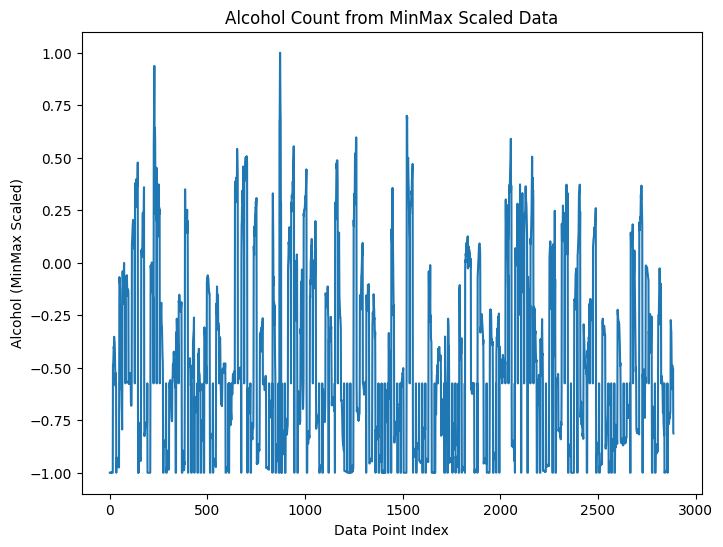

In [ ]:
try:
  alcohol_data = LE_data_min_max_scaled[:, LE_data_num.columns.get_loc('Alcohol')]
  plt.figure(figsize=(8, 6))
  plt.plot(alcohol_data)
  plt.xlabel("Data Point Index")
  plt.ylabel("Alcohol (MinMax Scaled)")
  plt.title("Alcohol Count from MinMax Scaled Data")
  plt.show()
except (NameError, KeyError):
    print("Error: 'LE_num_min_max_scaled' or 'Alcohol' column not found.")

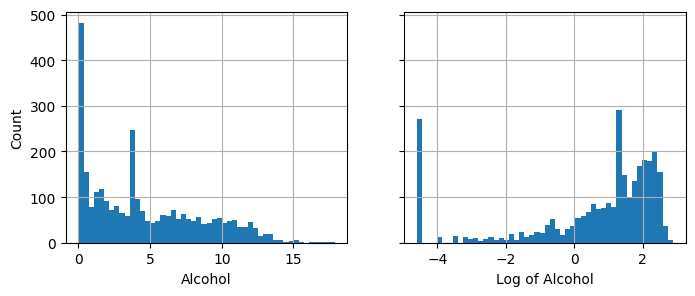

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(8, 3), sharey=True)
LE_data_tr["Alcohol"].hist(ax=axs[0], bins=50)
LE_data_tr["Alcohol"].apply(np.log).hist(ax=axs[1], bins=50)
axs[0].set_xlabel("Alcohol")
axs[1].set_xlabel("Log of Alcohol")
axs[0].set_ylabel("Count")
plt.show()

In [ ]:
LE_encoded.isnull().sum()

,0
index,285
Year,285
Life expectancy,285
Adult Mortality,285
infant deaths,285
...,...
Country_Yemen,285
Country_Zambia,285
Country_Zimbabwe,285
Status_Developed,285


In [ ]:
LE_encoded.dropna(inplace=True)

In [ ]:
# Convert LE_data_min_max_scaled to a DataFrame
LE_data_min_max_scaled_df = pd.DataFrame(LE_data_min_max_scaled,
                                         columns=LE_data_tr.columns,
                                         index=LE_data_tr.index)
LE_joined = pd.concat([LE_data_min_max_scaled_df, LE_encoded], axis=1)
print(LE_joined.head())

      index      Year  Life expectancy   Adult Mortality  infant deaths  \
0 -1.000000  1.000000          0.089184        -0.274238      -0.931111   
1 -0.999319  0.866667         -0.104364        -0.252078      -0.928889   
2 -0.998638  0.733333         -0.104364        -0.260388      -0.926667   
3 -0.997957  0.600000         -0.119545        -0.249307      -0.923333   
4 -0.997276  0.466667         -0.130930        -0.240997      -0.921111   

   Alcohol  percentage expenditure  Hepatitis B  Measles       BMI   ...  \
0     -1.0               -0.992682     0.306122 -0.989123 -0.527415  ...   
1     -1.0               -0.992451     0.244898 -0.995362 -0.540470  ...   
2     -1.0               -0.992483     0.285714 -0.995947 -0.553525  ...   
3     -1.0               -0.991973     0.346939 -0.973730 -0.566580  ...   
4     -1.0               -0.999271     0.367347 -0.971600 -0.577023  ...   

   Country_Uruguay  Country_Uzbekistan  Country_Vanuatu  \
0              0.0               

In [ ]:
LE_joined.isnull().sum()

,0
index,0
Year,0
Life expectancy,0
Adult Mortality,0
infant deaths,0
...,...
Country_Yemen,984
Country_Zambia,984
Country_Zimbabwe,984
Status_Developed,984


####Checking for skewness

In [ ]:
from scipy.stats import skew

numerical_cols = LE_data_min_max_scaled_df.select_dtypes(include=['number']).columns
skewness_values = LE_data_min_max_scaled_df[numerical_cols].apply(lambda x: skew(x))
# skewed columns (e.g., skewness > 0.5 or < -0.5)
skewed_cols = skewness_values[(skewness_values > 0.5) | (skewness_values < -0.5)]

print("\nSkewed columns (abs(skewness) > 0.5):\n", skewed_cols)

all_skewed = all(abs(val) > 0.5 for val in skewness_values)
print(f"\nAre all columns skewed? {all_skewed}")


Skewed columns (abs(skewness) > 0.5):
 Life expectancy                    -0.662818
Adult Mortality                     1.207905
infant deaths                       9.710701
Alcohol                             0.629579
percentage expenditure              4.607383
Hepatitis B                        -2.277090
Measles                             9.361602
under-five deaths                   9.424873
Polio                              -2.110767
Total expenditure                   0.622424
Diphtheria                         -2.086834
 HIV/AIDS                           5.358495
GDP                                 3.505474
Population                         17.830440
 thinness  1-19 years               1.711057
 thinness 5-9 years                 1.777051
Income composition of resources    -1.209395
dtype: float64

Are all columns skewed? False


##Transformation Pipeline

In [ ]:
from sklearn.pipeline import Pipeline

num_pipeline = Pipeline([
    ("impute", SimpleImputer(strategy="median")),
    ("standardize", StandardScaler()),
])

In [ ]:
from sklearn.pipeline import make_pipeline

num_pipeline = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())

In [ ]:
from sklearn import set_config

set_config(display='diagram')

num_pipeline

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

In [ ]:
LE_num_prepared = num_pipeline.fit_transform(LE_data_num)
LE_num_prepared[:2].round(2)

array([[-1.72,  1.62, -0.46,  0.8 ,  0.27, -1.17, -0.34, -0.78, -0.11,
        -0.96,  0.25, -3.29,  0.94, -0.74, -0.32, -0.46,  0.43,  2.79,
         2.75, -0.78, -0.65],
       [-1.72,  1.41, -1.  ,  0.87,  0.28, -1.17, -0.34, -0.91, -0.17,
        -0.98,  0.27, -1.06,  0.95, -0.86, -0.32, -0.45, -0.18,  2.86,
         2.8 , -0.79, -0.69]])

In [ ]:
def monkey_patch_get_signature_names_out():
    """Monkey patch some classes which did not handle get_feature_names_out()
       correctly in Scikit-Learn 1.0.*."""
    from inspect import Signature, signature, Parameter
    import pandas as pd
    from sklearn.impute import SimpleImputer
    from sklearn.pipeline import make_pipeline, Pipeline
    from sklearn.preprocessing import FunctionTransformer, StandardScaler

    default_get_feature_names_out = StandardScaler.get_feature_names_out

    if not hasattr(SimpleImputer, "get_feature_names_out"):
      print("Monkey-patching SimpleImputer.get_feature_names_out()")
      SimpleImputer.get_feature_names_out = default_get_feature_names_out

    if not hasattr(FunctionTransformer, "get_feature_names_out"):
        print("Monkey-patching FunctionTransformer.get_feature_names_out()")
        orig_init = FunctionTransformer.__init__
        orig_sig = signature(orig_init)

        def __init__(*args, feature_names_out=None, **kwargs):
            orig_sig.bind(*args, **kwargs)
            orig_init(*args, **kwargs)
            args[0].feature_names_out = feature_names_out

        __init__.__signature__ = Signature(
            list(signature(orig_init).parameters.values()) + [
                Parameter("feature_names_out", Parameter.KEYWORD_ONLY)])

        def get_feature_names_out(self, names=None):
            if callable(self.feature_names_out):
                return self.feature_names_out(self, names)
            assert self.feature_names_out == "one-to-one"
            return default_get_feature_names_out(self, names)

        FunctionTransformer.__init__ = __init__
        FunctionTransformer.get_feature_names_out = get_feature_names_out

monkey_patch_get_signature_names_out()

In [ ]:
df_LE_num_prepared = pd.DataFrame(
    LE_num_prepared, columns=num_pipeline.get_feature_names_out(),
    index=LE_data_num.index)

In [ ]:
df_LE_num_prepared.head(10)

,index,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,-1.716944,1.624954,-0.458128,0.803586,0.266551,-1.165314,-0.338634,-0.784022,-0.111470,-0.958010,...,-3.286470,0.938013,-0.737484,-0.322498,-0.456382,0.430669,2.793582,2.753808,-0.778123,-0.653915
1,-1.715765,1.407852,-0.995321,0.868104,0.283376,-1.165314,-0.337513,-0.914565,-0.168740,-0.983061,...,-1.057544,0.946381,-0.864362,-0.322498,-0.454259,-0.182846,2.861445,2.798158,-0.793073,-0.686096
2,-1.714585,1.190751,-0.995321,0.843910,0.300201,-1.165314,-0.337665,-0.827536,-0.174103,-1.008112,...,-0.886088,0.925460,-0.779777,-0.322498,-0.452837,0.393853,2.906687,2.842507,-0.822974,-0.718276
3,-1.713405,0.973649,-1.037454,0.876168,0.325439,-1.165314,-0.335186,-0.696994,0.029802,-1.033163,...,-0.671768,1.088650,-0.652899,-0.322498,-0.449983,-0.120972,2.951930,2.909031,-0.857857,-0.750457
4,-1.712225,0.756548,-1.069053,0.900362,0.342264,-1.165314,-0.370681,-0.653480,0.049353,-1.053204,...,-0.628904,0.816666,-0.610606,-0.322498,-0.495261,-0.134163,3.019793,2.953381,-0.902707,-0.846998
5,-1.711046,0.539446,-1.111186,0.932621,0.367501,-1.165314,-0.334439,-0.740508,-0.039234,-1.078255,...,-0.714632,1.373187,-0.695192,-0.322498,-0.458691,-0.135916,3.065036,2.997730,-0.932608,-0.943539
6,-1.709866,0.322345,-1.132253,0.948751,0.392738,-1.165314,-0.345882,-0.871051,0.036203,-1.103307,...,-0.843224,1.465243,-0.822069,-0.322498,-0.466713,-0.183640,3.110278,3.064255,-1.002375,-1.040080
7,-1.708686,0.105243,-1.184919,0.997139,0.417976,-1.160229,-0.361305,-0.827536,-0.072973,-1.128358,...,-0.800360,1.009147,-0.779777,-0.322498,-0.472128,-0.138739,3.155520,3.108604,-1.007358,-1.104441
8,-1.707507,-0.111858,-1.248118,1.061656,0.434801,-1.162771,-0.368777,-0.871051,-0.112594,-1.153409,...,-0.843224,0.339648,-0.822069,-0.322498,-0.472392,0.299924,3.200763,3.152954,-1.097059,-1.200982
9,-1.706327,-0.328960,-1.269184,1.061656,0.451626,-1.160229,-0.365651,-0.827536,-0.039147,-1.178460,...,-1.057544,0.632554,-1.033532,-0.322498,-0.479654,-0.141312,3.246005,3.197303,-1.146892,-1.297523


In [ ]:
num_pipeline.steps

[('simpleimputer', SimpleImputer(strategy='median')),
 ('standardscaler', StandardScaler())]

In [ ]:
num_pipeline[1]

StandardScaler()

In [ ]:
num_pipeline[:-1]

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median'))])

In [ ]:
num_pipeline.named_steps["simpleimputer"]

SimpleImputer(strategy='median')

In [ ]:
num_pipeline.set_params(simpleimputer__strategy="median")

Pipeline(steps=[('simpleimputer', SimpleImputer(strategy='median')),
                ('standardscaler', StandardScaler())])

In [ ]:
from sklearn.compose import ColumnTransformer

num_attribs = ['index', 'Year', 'Life expectancy ', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles ', ' BMI ',
       'under-five deaths ', 'Polio', 'Total expenditure', 'Diphtheria ',
       ' HIV/AIDS', 'GDP', 'Population', ' thinness  1-19 years',
       ' thinness 5-9 years', 'Income composition of resources', 'Schooling']
cat_attribs = ['Country', 'Status']

cat_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore"))

preprocessing = ColumnTransformer([
    ("num", num_pipeline, num_attribs),
    ("cat", cat_pipeline, cat_attribs),
])

In [ ]:
from sklearn.compose import make_column_selector, make_column_transformer

preprocessing = make_column_transformer(
    (num_pipeline, make_column_selector(dtype_include=np.number)),
    (cat_pipeline, make_column_selector(dtype_include=object)),
)

In [ ]:
LE_prepared = preprocessing.fit_transform(LE_data)

In [ ]:
LE_prepared_fr = pd.DataFrame(
    LE_prepared.toarray(),  # Convert sparse matrix to dense array if needed
    columns=preprocessing.get_feature_names_out(),
    index=LE_data.index)
LE_prepared_fr.head(2)

,pipeline-1__index,pipeline-1__Year,pipeline-1__Life expectancy,pipeline-1__Adult Mortality,pipeline-1__infant deaths,pipeline-1__Alcohol,pipeline-1__percentage expenditure,pipeline-1__Hepatitis B,pipeline-1__Measles,pipeline-1__ BMI,...,pipeline-2__Country_Uruguay,pipeline-2__Country_Uzbekistan,pipeline-2__Country_Vanuatu,pipeline-2__Country_Venezuela (Bolivarian Republic of),pipeline-2__Country_Viet Nam,pipeline-2__Country_Yemen,pipeline-2__Country_Zambia,pipeline-2__Country_Zimbabwe,pipeline-2__Status_Developed,pipeline-2__Status_Developing
0,-1.716944,1.624954,-0.458128,0.803586,0.266551,-1.165314,-0.338634,-0.784022,-0.11147,-0.958010,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,-1.715765,1.407852,-0.995321,0.868104,0.283376,-1.165314,-0.337513,-0.914565,-0.16874,-0.983061,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import FunctionTransformer

def column_ratio(X):
    # Replace inf and -inf with NaN
    X = np.nan_to_num(X, posinf=np.nan, neginf=np.nan)
    # Replace 0 in the denominator with a small value to avoid division by zero
    X[:, 1][X[:, 1] == 0] = 1e-10  # Replace 0 with a small positive value
    return X[:, [0]] / X[:, [1]]

def ratio_name(function_transformer, feature_names_in):
    return ["ratio"]  # feature names out

def ratio_pipeline():
    return make_pipeline(
        SimpleImputer(strategy="median"),
        FunctionTransformer(column_ratio, feature_names_out=ratio_name),
        StandardScaler()
    )

log_pipeline = make_pipeline(
    SimpleImputer(strategy="median"),
    # Use FunctionTransformer with np.log1p, handling NaNs and zeros:
    FunctionTransformer(lambda x: np.log1p(np.where(x > 0, x, 1e-10)), feature_names_out="one-to-one"),  # Handle negative or zero values
    StandardScaler()
)

categorical_pipeline = make_pipeline(
    SimpleImputer(strategy="most_frequent"),
    OneHotEncoder(handle_unknown="ignore")
)

# Correct syntax in the default_num_pipeline
default_num_pipeline = make_pipeline(
    SimpleImputer(strategy="median"), # add a comma between each pipeline step
    StandardScaler()
)

preprocessing = ColumnTransformer([
    ("life_expectancy_ratio", ratio_pipeline(), ["Life expectancy ", "Schooling"]),
    ("gdp_per_capita", ratio_pipeline(), ["GDP", "Population"]),
    ("log_transform", log_pipeline, ["GDP", "Population", "Total expenditure"]),
    ("categorical", categorical_pipeline, ["Country", "Status"])
],
    remainder=default_num_pipeline
)

# Replace inf and -inf with NaN before fitting
LE_data.replace([np.inf, -np.inf], np.nan, inplace=True)

# Clip extremely large or small values
for col in LE_data.select_dtypes(include=np.number).columns:
    LE_data[col] = np.clip(LE_data[col], a_min=-1e10, a_max=1e10)

In [ ]:
LE_prepared = preprocessing.fit_transform(LE_data)
LE_prepared.shape

(2888, 204)

In [ ]:
preprocessing.get_feature_names_out()

array(['life_expectancy_ratio__ratio', 'gdp_per_capita__ratio',
       'log_transform__GDP', 'log_transform__Population',
       'log_transform__Total expenditure',
       'categorical__Country_Afghanistan', 'categorical__Country_Albania',
       'categorical__Country_Algeria', 'categorical__Country_Angola',
       'categorical__Country_Antigua and Barbuda',
       'categorical__Country_Argentina', 'categorical__Country_Armenia',
       'categorical__Country_Australia', 'categorical__Country_Austria',
       'categorical__Country_Azerbaijan', 'categorical__Country_Bahamas',
       'categorical__Country_Bahrain', 'categorical__Country_Bangladesh',
       'categorical__Country_Barbados', 'categorical__Country_Belarus',
       'categorical__Country_Belgium', 'categorical__Country_Belize',
       'categorical__Country_Benin', 'categorical__Country_Bhutan',
       'categorical__Country_Bolivia (Plurinational State of)',
       'categorical__Country_Bosnia and Herzegovina',
       'categoric

##Training, evaluating and selecting a model


In [ ]:
from sklearn.linear_model import LinearRegression

# Ensure LE_labels has the same number of samples as LE_data
LE_labels = LE_data["Life expectancy "]  # Select the target column from LE_data

lin_reg = make_pipeline(preprocessing, LinearRegression())
lin_reg.fit(LE_data, LE_labels)  # Fit the model with consistent data and labels

/usr/local/lib/python3.11/dist-packages/sklearn/compose/_column_transformer.py:1651: FutureWarning:


The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).




Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('life_expectancy_ratio',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function rati...
                                                                   FunctionTransformer(feature_names_out='one-to-one',
                                                                                       func=<function <lambda> at 0x78f1b4498360>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['GDP', 'Population',
                                                   'Total expenditure']),
                                                 ('categorical',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Country', 'Status'])])),
                ('linearregression', LinearRegression())])

In [ ]:
LE_predictions = lin_reg.predict(LE_data)
LE_predictions[:5].round(-2)  # -2 = rounded to the nearest hundred

array([100., 100., 100., 100., 100.])

In [ ]:
LE_labels.iloc[:5].values

array([65. , 59.9, 59.9, 59.5, 59.2])

In [ ]:
# extra code – computes the error ratios discussed in the book
error_ratios = LE_predictions[:5].round(-2) / LE_labels.iloc[:5].values - 1
print(", ".join([f"{100 * ratio:.1f}%" for ratio in error_ratios]))

53.8%, 66.9%, 66.9%, 68.1%, 68.9%


In [ ]:
from sklearn.metrics import mean_squared_error

lin_rmse = mean_squared_error(LE_labels, LE_predictions)
lin_rmse

3.278203431774958

In [ ]:
X = LE_joined.drop('Life expectancy ', axis=1)
y = LE_joined['Life expectancy ']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Replace NaN values in X_train with the mean of each column
X_train = X_train.fillna(X_train.mean())

# Replace NaN values in X_test with the mean of each column
X_test = X_test.fillna(X_test.mean())

y_train = y_train.fillna(y_train.mean())
y_test = y_test.fillna(y_test.mean())

# Now you can fit the model:
model.fit(X_train, y_train)

# Initialize and train the linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 4.238232408586768
R-squared: 0.9105864712153611


In [ ]:
from sklearn.tree import DecisionTreeRegressor

tree_reg = make_pipeline(preprocessing, DecisionTreeRegressor(random_state=42))
tree_reg.fit(LE_data, LE_labels)

/usr/local/lib/python3.11/dist-packages/sklearn/compose/_column_transformer.py:1651: FutureWarning:


The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).




Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('life_expectancy_ratio',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function rati...
                                                                                       func=<function <lambda> at 0x78f1b4498360>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['GDP', 'Population',
                                                   'Total expenditure']),
                                                 ('categorical',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Country', 'Status'])])),
                ('decisiontreeregressor',
                 DecisionTreeRegressor(random_state=42))])

In [ ]:
housing_predictions = tree_reg.predict(LE_data)
tree_rmse = mean_squared_error(LE_labels, LE_predictions)
tree_rmse

3.278203431774958

##Cross Validation

In [ ]:
from sklearn.model_selection import cross_val_score

tree_rmses = -cross_val_score(tree_reg, LE_data, LE_labels,
                              scoring="neg_root_mean_squared_error", cv=10)

In [ ]:
pd.Series(tree_rmses).describe()

,0
count,10.000000
mean,3.991715
std,0.519613
min,3.268244
25%,3.570765
50%,4.118963
75%,4.207591
max,4.801658


In [ ]:
lin_rmses = -cross_val_score(lin_reg, LE_data, LE_labels,
                              scoring="neg_root_mean_squared_error", cv=10)
pd.Series(lin_rmses).describe()

,0
count,10.000000
mean,6.949059
std,1.289340
min,5.511786
25%,6.120779
50%,6.589661
75%,7.438677
max,9.877013


In [ ]:
from sklearn.ensemble import RandomForestRegressor

forest_reg = make_pipeline(preprocessing,
                           RandomForestRegressor(random_state=42))
forest_rmses = -cross_val_score(forest_reg, LE_data, LE_labels,
                                scoring="neg_root_mean_squared_error", cv=10)

In [ ]:
pd.Series(forest_rmses).describe()

,0
count,10.000000
mean,2.737455
std,0.397241
min,2.262634
25%,2.409948
50%,2.680057
75%,3.052592
max,3.441431


*Let*'s compare this RMSE measured using cross-validation (the "validation error") with the RMSE measured on the training set (the "training error"):

In [ ]:
forest_reg.fit(LE_data, LE_labels)
LE_predictions = forest_reg.predict(LE_data)
forest_rmse = mean_squared_error(LE_labels, LE_predictions)
forest_rmse

0.41155645602493235

#Fine tuning the model

##Grid Search

In [ ]:
from sklearn.model_selection import GridSearchCV
param_grid = [
    {'randomforestregressor__n_estimators': [3, 10, 30], 'randomforestregressor__max_features': [2, 4, 6, 8]},
    {'randomforestregressor__bootstrap': [False], 'randomforestregressor__n_estimators': [3, 10], 'randomforestregressor__max_features': [2, 3, 4]},
]

forest_reg = make_pipeline(preprocessing, RandomForestRegressor(random_state=42))

grid_search = GridSearchCV(forest_reg, param_grid, cv=5, scoring='neg_mean_squared_error',
                           return_train_score=True)
grid_search.fit(LE_data, LE_labels)

/usr/local/lib/python3.11/dist-packages/sklearn/compose/_column_transformer.py:1651: FutureWarning:


The format of the columns of the 'remainder' transformer in ColumnTransformer.transformers_ will change in version 1.7 to match the format of the other transformers.
At the moment the remainder columns are stored as indices (of type int). With the same ColumnTransformer configuration, in the future they will be stored as column names (of type str).
To use the new behavior now and suppress this warning, use ColumnTransformer(force_int_remainder_cols=False).




GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('columntransformer',
                                        ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                                                     SimpleImputer(strategy='median')),
                                                                                    ('standardscaler',
                                                                                     StandardScaler())]),
                                                          transformers=[('life_expectancy_ratio',
                                                                         Pipeline(steps=[('simpleimputer',
                                                                                          SimpleImputer(strategy='median')),
                                                                                         ('functiontransformer',
                                                                                          FunctionTransformer(fea...
                                       ('randomforestregressor',
                                        RandomForestRegressor(random_state=42))]),
             param_grid=[{'randomforestregressor__max_features': [2, 4, 6, 8],
                          'randomforestregressor__n_estimators': [3, 10, 30]},
                         {'randomforestregressor__bootstrap': [False],
                          'randomforestregressor__max_features': [2, 3, 4],
                          'randomforestregressor__n_estimators': [3, 10]}],
             return_train_score=True, scoring='neg_mean_squared_error')

In [ ]:
grid_search.best_params_

{'randomforestregressor__max_features': 8,
 'randomforestregressor__n_estimators': 30}

In [ ]:
grid_search.best_estimator_

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder=Pipeline(steps=[('simpleimputer',
                                                              SimpleImputer(strategy='median')),
                                                             ('standardscaler',
                                                              StandardScaler())]),
                                   transformers=[('life_expectancy_ratio',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('functiontransformer',
                                                                   FunctionTransformer(feature_names_out=<function rati...
                                                                                       func=<function <lambda> at 0x78f1b4498360>)),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['GDP', 'Population',
                                                   'Total expenditure']),
                                                 ('categorical',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['Country', 'Status'])])),
                ('randomforestregressor',
                 RandomForestRegressor(max_features=8, n_estimators=30,
                                       random_state=42))])

In [ ]:
cv_res = pd.DataFrame(grid_search.cv_results_)
cv_res.sort_values(by="mean_test_score", ascending=False, inplace=True)

In [ ]:
cv_res.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_randomforestregressor__max_features,param_randomforestregressor__n_estimators,param_randomforestregressor__bootstrap,params,split0_test_score,split1_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
11,0.490078,0.004646,0.024207,0.001267,8,30,NaN,"{'randomforestregressor__max_features': 8, 'ra...",-16.405103,-10.561473,...,-12.765127,1.958024,1,-0.754824,-0.721294,-0.715018,-0.666502,-0.727897,-0.717107,0.028711
8,0.614838,0.122687,0.027910,0.005178,6,30,NaN,"{'randomforestregressor__max_features': 6, 'ra...",-17.390245,-10.654039,...,-14.520838,3.082020,2,-0.782761,-0.706828,-0.744873,-0.696995,-0.747001,-0.735692,0.030849
5,0.437618,0.005872,0.023057,0.000206,4,30,NaN,"{'randomforestregressor__max_features': 4, 'ra...",-17.652264,-11.400357,...,-14.718971,2.490925,3,-0.769508,-0.762300,-0.784092,-0.746660,-0.707131,-0.753938,0.026327
2,0.660637,0.009141,0.037807,0.000960,2,30,NaN,"{'randomforestregressor__max_features': 2, 'ra...",-20.243261,-12.272234,...,-15.835411,3.017368,4,-0.859188,-0.770215,-0.810549,-0.735518,-0.815730,-0.798240,0.042170
10,0.189093,0.002459,0.022340,0.003770,8,10,NaN,"{'randomforestregressor__max_features': 8, 'ra...",-21.711244,-13.306354,...,-15.991263,2.996866,5,-1.171045,-1.047552,-1.024375,-0.969823,-1.158684,-1.074296,0.078235


#Final results RMSEs
Linear regression without CV, sampling, imputation etc = 4.238

Linear regression with imputation, cv etc = 3.2782

Random forest with out CV = 2.2636

Random forest with CV = 0.411556